## Script to extract components (muscles active together during recording) with NMF and then count nb of blobs inside them with wathershed. Do that for multiple timepoints

In [1]:
from my_utils import utils
from matplotlib import pyplot as plt
from scipy.ndimage import median_filter
from tqdm import tqdm
import numpy as np
import cv2
import os
from scipy.signal import find_peaks
import importlib

In [6]:
import pickle
#load the components and W matrices
with open("nmf_components.pkl", "rb") as f:
    components,W = pickle.load(f)
with open("nmf2_components.pkl", "rb") as f:
    components2,W2 = pickle.load(f)
with open("nmf3_components.pkl", "rb") as f:
    components3,W3 = pickle.load(f)
with open("nmf35_components.pkl", "rb") as f:
    components35,W35 = pickle.load(f)

In [2]:

x=127
y=724
w=403
h=633

In [2]:
root_folder = "Z:/data/LD/experiments/imaging/output/Automated_experiment/pupa_9/recording46_21032025_1526"

In [4]:
importlib.reload(utils)

<module 'my_utils.utils' from 'c:\\Master\\Master_thesis\\muscle_imaging\\Pipeline_analysis\\my_utils\\utils.py'>

In [6]:
# Load the frames from the MKV file and extract the pupa mask
mask_folder = root_folder
mkv_file_path = [os.path.join(root_folder, file) for file in os.listdir(root_folder) if file.endswith('.mkv')][0]
mask_frame_dir = "mask_extracted_frames"
utils.extract_frames_from_mkv(mkv_file_path,mask_frame_dir, limit_frames=10)
frames = utils.load_frames(mask_frame_dir,delete_frames=True)
mean_frame = np.mean(frames, axis=0)
mean_frame = utils.normalize_frame(mean_frame)
x,y,w,h = utils.crop_video_dynamic(mean_frame)
cropped_frame = mean_frame[y:y+h, x:x+w]
del frames

# # Load the frames from the main MKV file and apply mask to them
# mkv_file_path = [os.path.join(root_folder, file) for file in os.listdir(root_folder) if file.endswith('.mkv')][0]
# temp_frame_dir = "extracted_frames_o"
# #only extract frames if the directory does not exist
# if not os.path.exists(temp_frame_dir):
#     utils.extract_frames_from_mkv(mkv_file_path, temp_frame_dir, limit_frames=None)
# print("Extracted frames from MKV file")
# #apply motion correction
# mcorr_folder = "motion_corrected_frames_o"
# os.makedirs(mcorr_folder, exist_ok=True)
# utils.apply_motion_correction(orig_folder=temp_frame_dir, mcorr_folder=mcorr_folder, delete=False, offset_y=0, offset_x=0, correction = 0)
# raw_frames = utils.load_frames_fast(mcorr_folder, delete_frames=False)
# vis_raw_frame = raw_frames[0]
# print("Loaded frames from MKV file")
# # x = x - 142
# masked_frames = raw_frames[:, y:y+h, x:x+w]
# print("Applied cropping to frames")

Loaded 10 frames of shape (1920, 864) from extracted TIFFs.
Selected ROI : (x=314, y=1296, w=321, h=180)


In [ ]:
# x=393
# y=554
# w=379 
# h=621
# mcorr_folder = "motion_corrected_frames_o"
# raw_frames = utils.load_frames_fast(mcorr_folder, delete_frames=False)
# vis_raw_frame = raw_frames[0]
# print("Loaded frames from MKV file")
# masked_frames = raw_frames[:, y:y+h, x:x+w]
# print("Applied cropping to frames")

Loaded 9492 frames of shape (1920, 864)
Loaded frames from MKV file
Applied cropping to frames


Applied reduction to frames
Applied temporal filter to frames
Final frames shape: (9597, 316, 201)


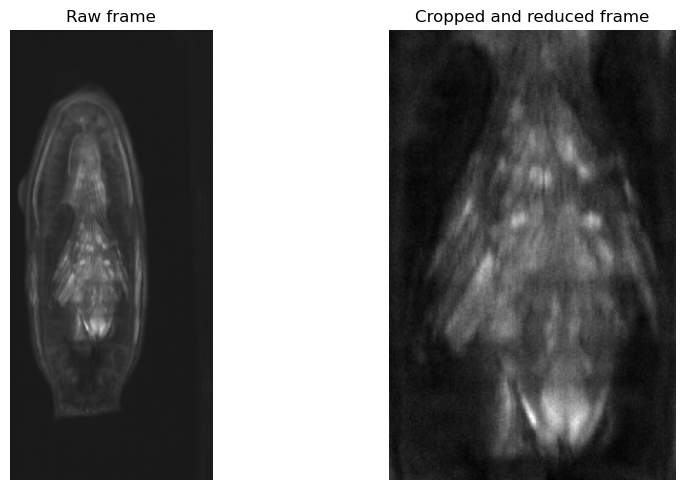

Applied baseline removal to frames


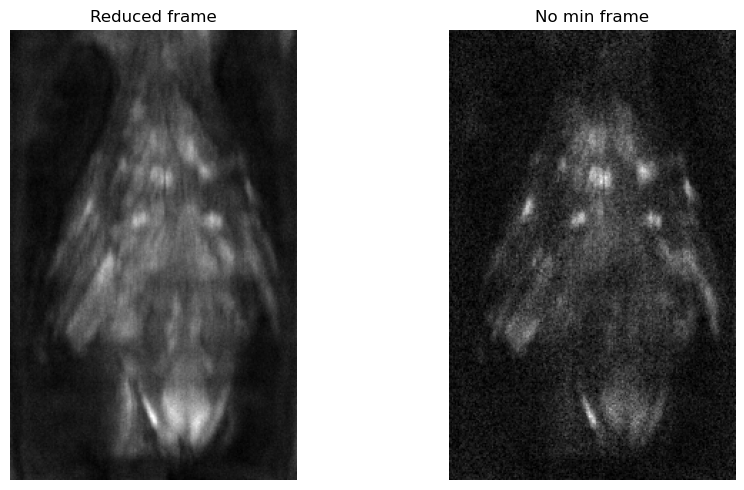

In [5]:
reduced_frames = utils.reduce_frame(masked_frames, factor = 2, method = "opencv")
print("Applied reduction to frames")
del masked_frames
temporal_frames = utils.temporal_filter(reduced_frames,high_cutoff=10.0)
print("Applied temporal filter to frames")
print("Final frames shape:", reduced_frames.shape)
utils.visualize_two_frames(vis_raw_frame,reduced_frames[0], title1="Raw frame", title2="Cropped and reduced frame")
del reduced_frames
no_min_frames = utils.remove_baseline(temporal_frames, clip =False)
print("Applied baseline removal to frames")
utils.visualize_two_frames(temporal_frames[0], no_min_frames[0], title1="Reduced frame", title2="No min frame")
del temporal_frames

In [14]:
importlib.reload(utils)

<module 'my_utils.utils' from 'c:\\Master\\Master_thesis\\muscle_imaging\\Pipeline_analysis\\my_utils\\utils.py'>

Number of frames: 9597, number of pixels: 63516
violation: 1.0
violation: 0.5082297018130257
violation: 0.3917917977901847
violation: 0.3293175440377375
violation: 0.28805768988446223
violation: 0.25736238327436234
violation: 0.23362846361949383
violation: 0.21459836109496305
violation: 0.1991729829604793
violation: 0.18694720933509226
violation: 0.17716922154668613
violation: 0.16920981965687112
violation: 0.16265068957607812
violation: 0.15715943342391414
violation: 0.1525776649530567
violation: 0.14856343103604183
violation: 0.1450959347400528
violation: 0.14224881895481317
violation: 0.1397877363404443
violation: 0.13756478496163227
violation: 0.13556274664370013
violation: 0.13368362659002997
violation: 0.13193971818787706
violation: 0.13037491715416463
violation: 0.12891980078374193
violation: 0.12757879142571232
violation: 0.12628357047569694
violation: 0.12506538015779395
violation: 0.1238959070322147
violation: 0.12281799771575486
violation: 0.12180160996458982
violation: 0.12

c:\ProgramData\miniconda3\envs\mthesis_env\Lib\site-packages\sklearn\decomposition\_nmf.py:1759: ConvergenceWarning: Maximum number of iterations 500 reached. Increase it to improve convergence.
  warnings.warn(


NMF fitted


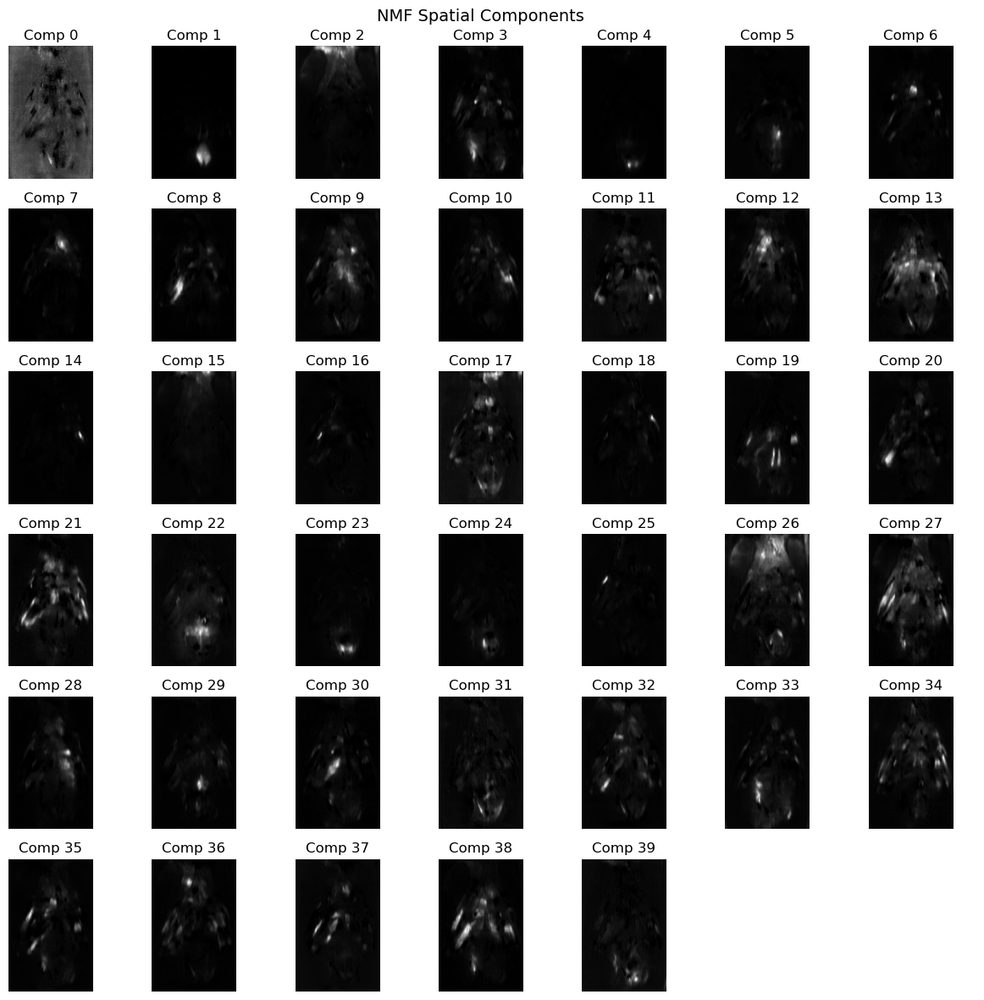

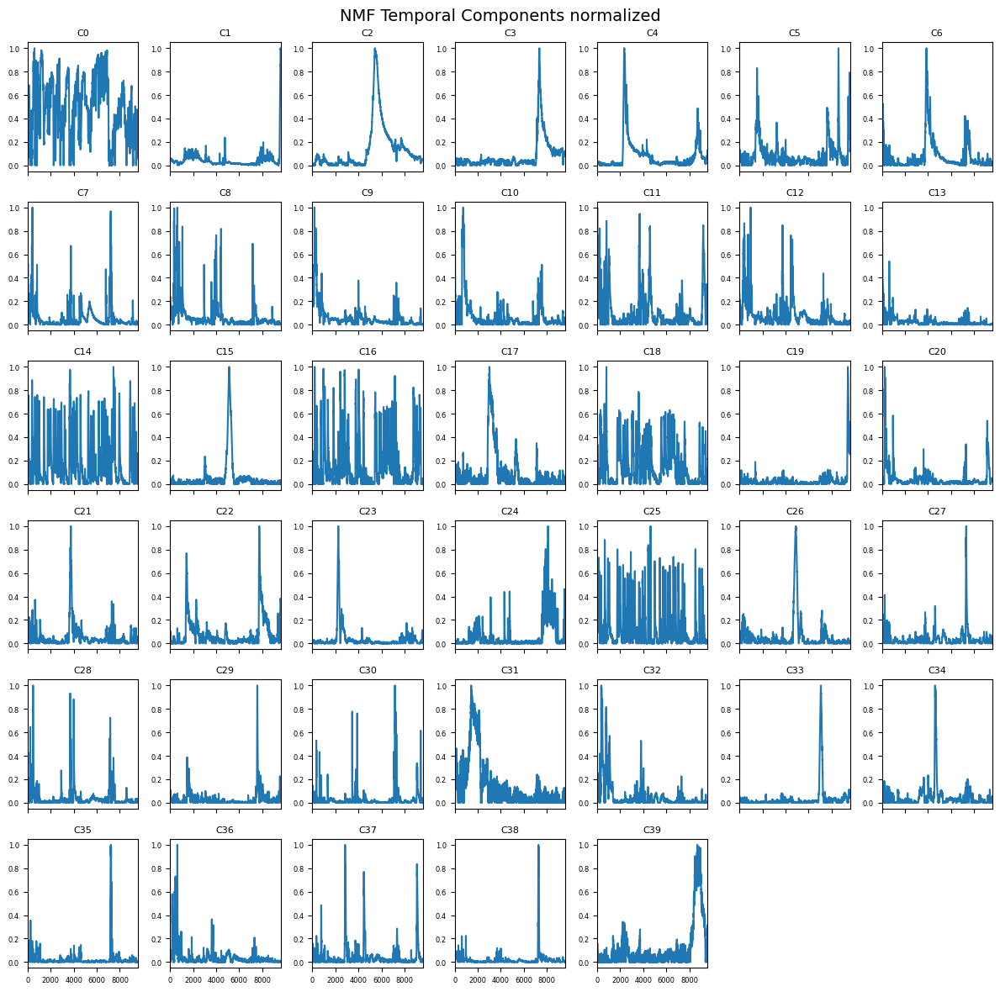

In [6]:
components, W = utils.apply_nmf(frames=no_min_frames,n_components=40,max_iter=500,alpha_H=1.0,verbose=2,tol=5e-2, scaling = False,save=False)

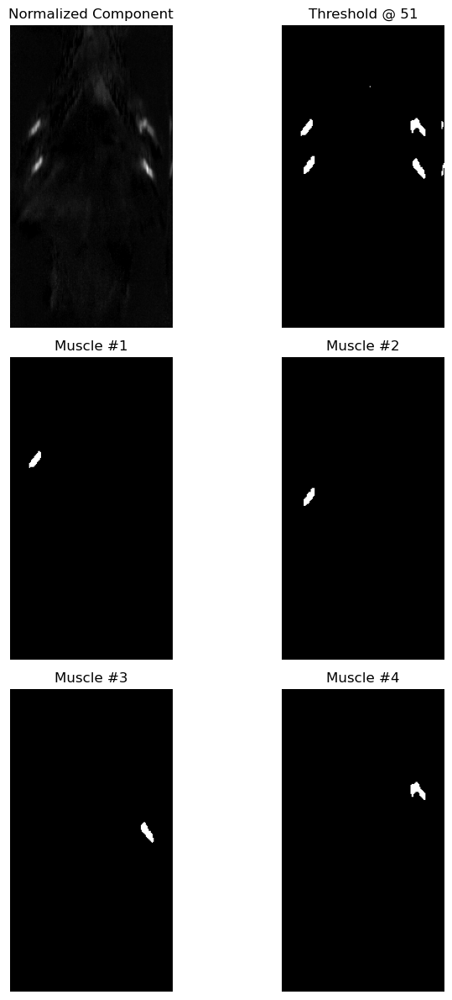

In [8]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# 1) Normalize
comp = components[36].astype(np.float32)
comp = 255*(comp - comp.min())/(comp.max() - comp.min())
comp = comp.astype(np.uint8)

# 2) Fractional threshold (tweak the 0.2 as needed)
thresh_val = int(comp.max() * 0.2)
_, mask = cv2.threshold(comp, thresh_val, 255, cv2.THRESH_BINARY)

# 3) Label
num_labels, labels = cv2.connectedComponents(mask)

# 4) Pick the 4 largest
areas = [(labels == i).sum() for i in range(1, num_labels)]
top4 = np.argsort(areas)[-4:] + 1

# 5) Extract masks
masks = [(labels == lbl).astype(np.uint8)*255 for lbl in top4]

# 6) Plot in a 3×2 grid
fig, axs = plt.subplots(3, 2, figsize=(8, 12))

# Row 0
axs[0,0].imshow(comp, cmap='gray')
axs[0,0].set_title("Normalized Component")
axs[0,1].imshow(mask, cmap='gray')
axs[0,1].set_title(f"Threshold @ {thresh_val}")

# Rows 1 & 2: four muscles
for i, m in enumerate(masks):
    row = 1 + (i // 2)   # 1 for first two masks, 2 for next two
    col = i % 2          # 0 then 1
    axs[row, col].imshow(m, cmap='gray')
    axs[row, col].set_title(f"Muscle #{i+1}")

# Turn off axes and tighten
for ax in axs.ravel():
    ax.axis('off')
plt.tight_layout()
plt.show()


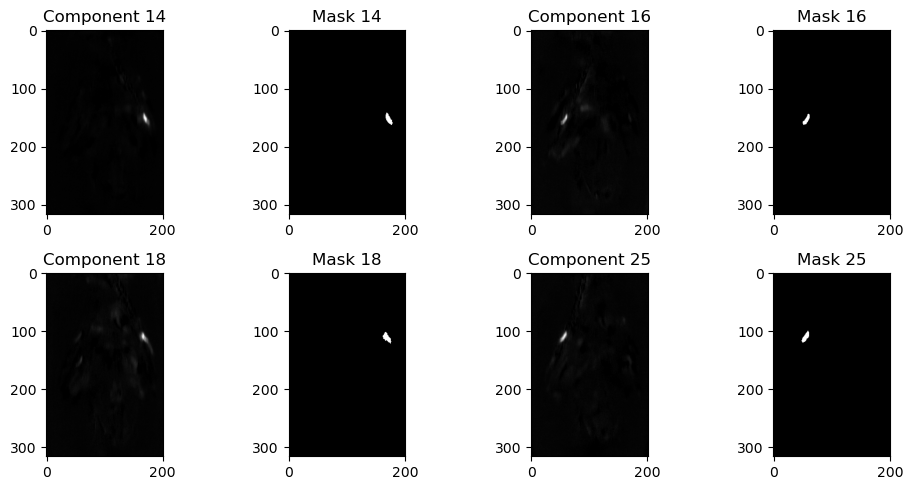

In [7]:
#use otsu thresholding to find the mask of the components
def fractional_threshold(component, fraction=0.2):
    # Normalize to 0–255
    comp = component.astype(np.float32)
    comp = 255 * (comp - comp.min()) / (comp.max() - comp.min())
    comp = comp.astype(np.uint8)

    # Apply threshold at specified fraction
    thresh_val = int(comp.max() * fraction)
    _, mask = cv2.threshold(comp, thresh_val, 255, cv2.THRESH_BINARY)
    return mask
otsu_mask_14 = fractional_threshold(components[14], fraction=0.2)
otsu_mask_16 = fractional_threshold(components[16], fraction=0.2)
otsu_mask_18 = fractional_threshold(components[18], fraction=0.2)
otsu_mask_25 = fractional_threshold(components[25], fraction=0.2)
#show components 12,17,19 and 29 next to their masks in a 2x4 grid
fig, axs = plt.subplots(2, 4, figsize=(10, 5))
axs[0, 0].imshow(components[14], cmap='gray')
axs[0, 0].set_title("Component 14")
axs[0, 1].imshow(otsu_mask_14, cmap='gray')
axs[0, 1].set_title("Mask 14")
axs[0, 2].imshow(components[16], cmap='gray')
axs[0, 2].set_title("Component 16")
axs[0, 3].imshow(otsu_mask_16, cmap='gray')
axs[0, 3].set_title("Mask 16")
axs[1, 0].imshow(components[18], cmap='gray')
axs[1, 0].set_title("Component 18")
axs[1, 1].imshow(otsu_mask_18, cmap='gray')
axs[1, 1].set_title("Mask 18")
axs[1, 2].imshow(components[25], cmap='gray')
axs[1, 2].set_title("Component 25")
axs[1, 3].imshow(otsu_mask_25, cmap='gray')
axs[1, 3].set_title("Mask 25")
plt.tight_layout()



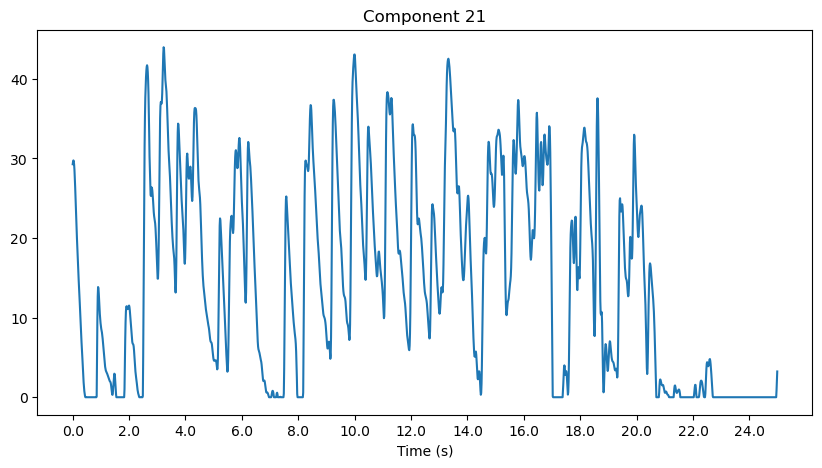

In [10]:
utils.zoom_temporal(0,2000,W,21)

In [11]:
def coverage_ratio(S, thresh=0.1):
    """
    S: np.ndarray, shape (n_comp, H, W)
    thresh: fraction of max to threshold at (e.g. 0.1)
    returns: coverage ratios shape (n_comp,)
    """
    n, H, W = S.shape
    ratios = np.zeros(n)
    for i in range(n):
        M = S[i]
        # normalize to [0,1]
        Mn, Mx = M.min(), M.max()
        if Mx == Mn:
            ratios[i] = 1.0
        else:
            MnM = (M - Mn) / (Mx - Mn)
            ratios[i] = np.mean(MnM >= thresh)
    return ratios

# then flag background as:
cov = coverage_ratio(components, thresh=0.1)
bg_idx = np.where(cov > 0.7)[0]
print(bg_idx)

[ 0 20]


In [133]:
print([(i,cov) for (i,cov) in enumerate(cov)])

[(0, 0.9414320801058002), (1, 0.7917060268278859), (2, 0.16621008879652371), (3, 0.08667107500472322), (4, 0.029897978462119782), (5, 0.011619119591913848), (6, 0.034794382517790795), (7, 0.168367025631337), (8, 0.06330688330499401), (9, 0.04287108759997481), (10, 0.04128093708671831), (11, 0.16313999622142453), (12, 0.13890988097487247), (13, 0.10641413187228414), (14, 0.003463694187291391), (15, 0.051136721456011086), (16, 0.09896718936960766), (17, 0.027221487499212795), (18, 0.008123937275647081), (19, 0.11252282889350715), (20, 0.05376598022545501), (21, 0.22194407708293973), (22, 0.06108697021222999), (23, 0.14456200012595252), (24, 0.021632344606083508), (25, 0.019837521254487057), (26, 0.18951130423830215), (27, 0.3331444045594811), (28, 0.011871024623716859), (29, 0.08498646010454058), (30, 0.025426664147616348), (31, 0.040903079539013794), (32, 0.1529378424334026), (33, 0.13094338434410227), (34, 0.13339945840418163), (35, 0.07489451476793249), (36, 0.19228225958813527), (37,

In [98]:
print(np.median(components[0]),np.median(components[1]),np.median(components[28]))

0.032774456 0.06987794 0.052661415


In [112]:
pos = np.argmax(components[14])
print(np.max(components[14]))
x,y = np.unravel_index(pos, components[14].shape)
print(x,y)

3.3396704
151 170


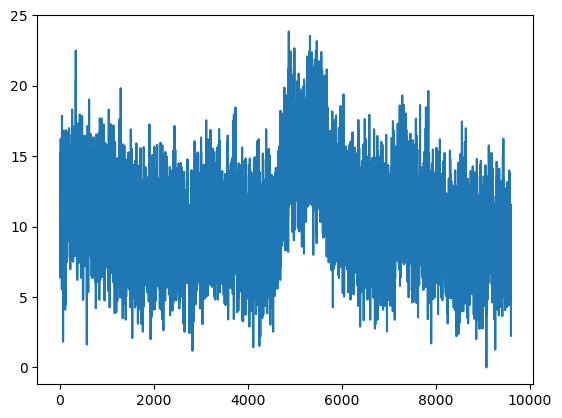

In [8]:
plt.plot(no_min_frames[:,50,50])

In [6]:
trace = utils.lowpass_filter(no_min_frames[:,50,50],5.0,80,order=3)


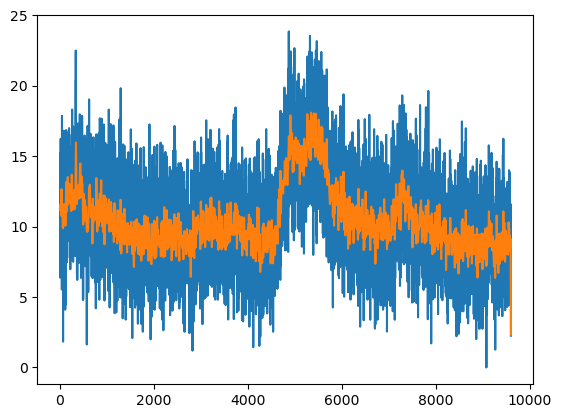

In [7]:
plt.plot(no_min_frames[:,50,50])
plt.plot(trace[:])

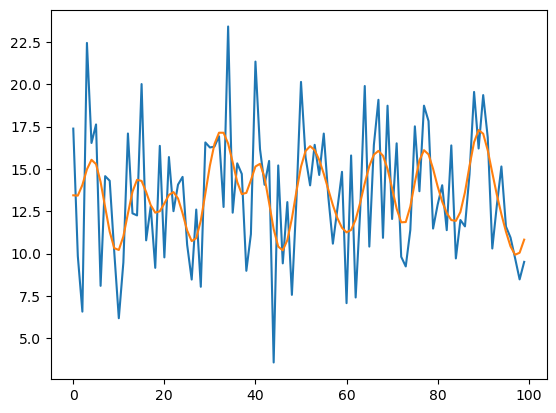

In [ ]:
plt.plot(no_min_frames[1000:1100,1,1])
plt.plot(trace[1000:1100])

In [85]:
trace2 = utils.lowpass_filter(no_min_frames[:,151,170],5.0,80,order=2)

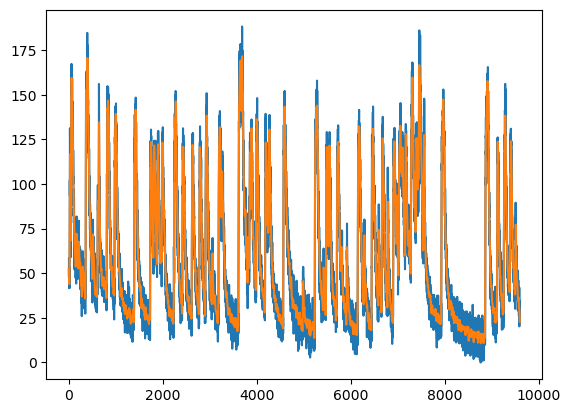

In [86]:
plt.plot(no_min_frames[:,151,170])
plt.plot(trace2[:])

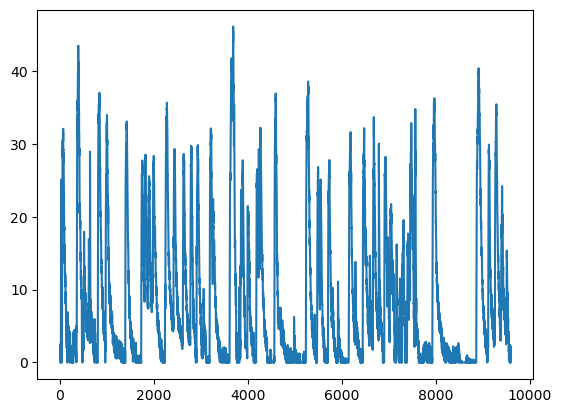

In [88]:
plt.plot(W[:,14])

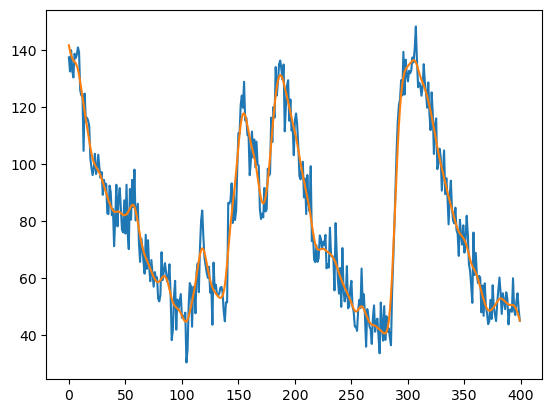

In [87]:
plt.plot(no_min_frames[3700:4100,151,170])
plt.plot(trace2[3700:4100])

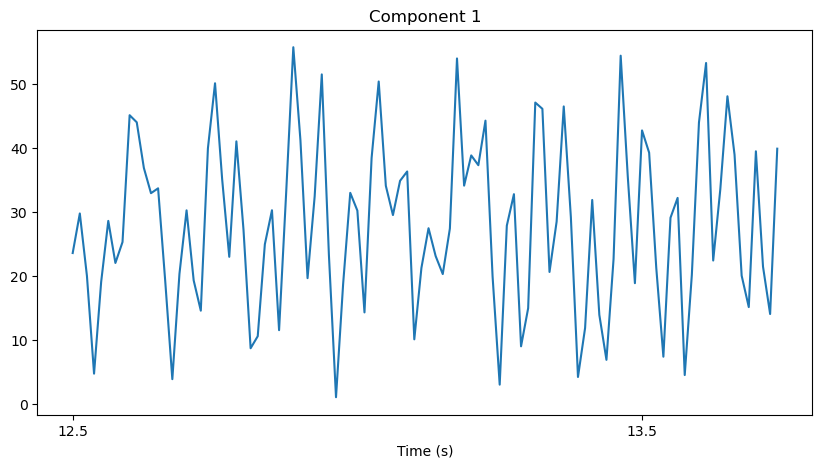

In [21]:
utils.zoom_temporal(1000,1100,W,1)

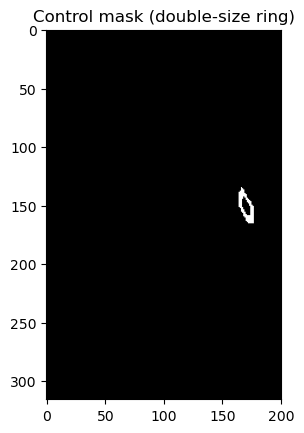

In [20]:
import cv2
import numpy as np

def make_ring_by_scaling(mask, scale=2.0):
    # mask: uint8 binary image (0 or 255)
    h, w = mask.shape
    ring = np.zeros_like(mask)

    # find all external contours
    cnts, _ = cv2.findContours(mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

    for cnt in cnts:
        # compute centroid
        M = cv2.moments(cnt)
        if M['m00'] == 0:
            continue
        cx = M['m10'] / M['m00']
        cy = M['m01'] / M['m00']

        # scale contour points about (cx, cy)
        cnt_scaled = []
        for [[x, y]] in cnt:
            x_new = cx + scale * (x - cx)
            y_new = cy + scale * (y - cy)
            cnt_scaled.append([[int(round(x_new)), int(round(y_new))]])
        cnt_scaled = np.array(cnt_scaled, dtype=np.int32)

        # fill the enlarged blob
        cv2.fillPoly(ring, [cnt_scaled], 255)

    # subtract the original mask to leave a ring
    ring = cv2.subtract(ring, mask)
    return ring

# usage:
control_mask_25 = make_ring_by_scaling(otsu_mask_25, scale=2.0)

orig_masks = [otsu_mask_14, otsu_mask_16, otsu_mask_18, otsu_mask_25]

# choose your favorite method:
make_ring = make_ring_by_scaling      # or make_ring_by_dilation

control_masks = [make_ring(m) for m in orig_masks]

# e.g. to view one:
import matplotlib.pyplot as plt
plt.imshow(control_masks[0], cmap='gray')

plt.title("Control mask (double‐size ring)")
plt.show()

Loaded 9598 frames of shape (1920, 864)
Loaded frames from MKV file
Applied cropping to frames


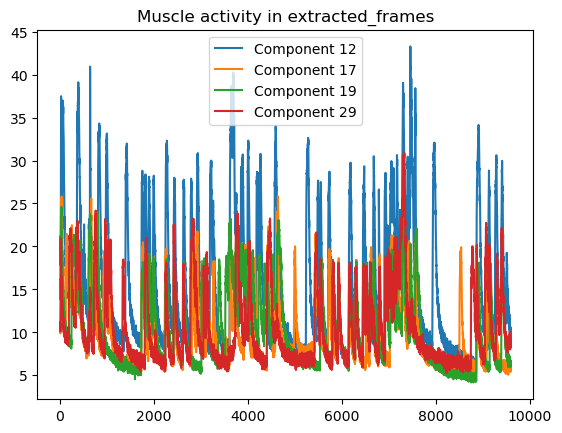

Loaded 9598 frames of shape (1920, 864)
Loaded frames from MKV file
Applied cropping to frames


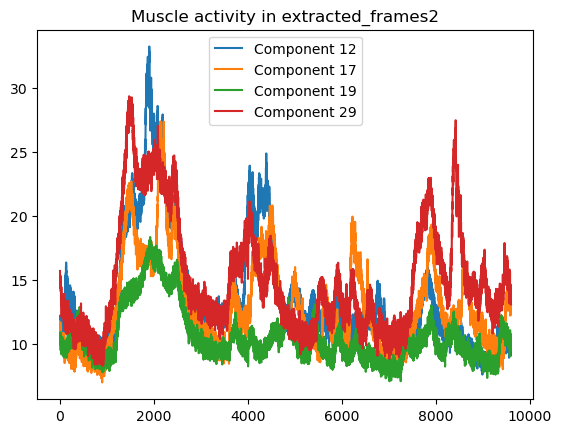

Loaded 9598 frames of shape (1920, 864)
Loaded frames from MKV file
Applied cropping to frames


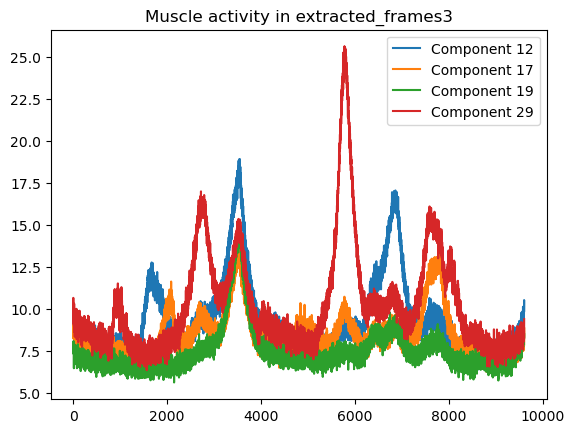

In [5]:
x=127
y=724
w=403
h=633
temp_frame_dirs = ["extracted_frames", "extracted_frames2", "extracted_frames3"]
# Load the frames from the MKV file and apply mask to them
for i,temp_frame_dir in enumerate(temp_frame_dirs):
    raw_frames = utils.load_frames_fast(temp_frame_dir, delete_frames=False)
    vis_raw_frame = raw_frames[0]
    print("Loaded frames from MKV file")
    cropped_frames = raw_frames[:, y:y+h, x:x+w]
    print("Applied cropping to frames")
    reduced_frames = utils.reduce_frame(cropped_frames, factor = 2, method = "opencv")
    reduced_frames = utils.remove_baseline(reduced_frames, clip =False)
    #Apply mask 12 to the frames and get the temporal trace by taking the mean of the pixels in the mask
    masked_frames_12 = np.multiply(reduced_frames, otsu_mask_12)
    temporal_trace_mask12 = np.mean(masked_frames_12, axis=(1, 2))
    masked_frames_17 = np.multiply(reduced_frames, otsu_mask_17)
    temporal_trace_mask17 = np.mean(masked_frames_17, axis=(1, 2))
    masked_frames_19 = np.multiply(reduced_frames, otsu_mask_19)
    temporal_trace_mask19 = np.mean(masked_frames_19, axis=(1, 2))
    masked_frames_29 = np.multiply(reduced_frames, otsu_mask_29)
    temporal_trace_mask29 = np.mean(masked_frames_29, axis=(1, 2))
    #save the temporal traces to a file
    with open(f"temporal_traces_{i}.pkl", "wb") as f:
        pickle.dump([temporal_trace_mask12, temporal_trace_mask17, temporal_trace_mask19, temporal_trace_mask29], f)
    plt.plot(temporal_trace_mask12)
    plt.plot(temporal_trace_mask17)
    plt.plot(temporal_trace_mask19)
    plt.plot(temporal_trace_mask29)
    plt.legend(["Component 12", "Component 17", "Component 19", "Component 29"])
    plt.title(f"Muscle activity in {temp_frame_dir}")
    plt.show()

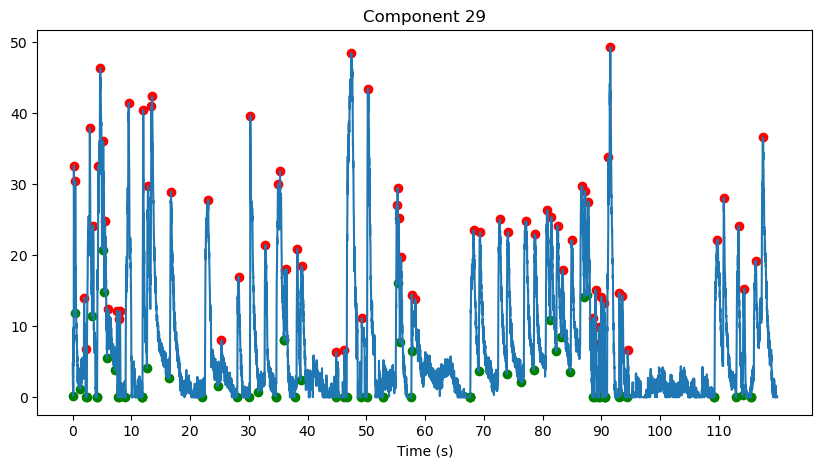

In [ ]:
plt.figure(figsize=(10, 5))
plt.plot(W[:, 28], label="Component 29")
plt.title("Component 29")
#change x axis from frames to seconds
total_frames = W.shape[0]
fps = 80
start_seconds = 0
step_seconds = 10  # Show every 5 seconds

# Compute positions and labels
second_ticks = range(0, total_frames // fps + 1, step_seconds)       # e.g., [0, 5, 10, ...]
frame_positions = [s * fps for s in second_ticks]                    # e.g., [0, 400, 800, ...]
second_labels = [s + start_seconds for s in second_ticks]           # e.g., [75, 80, 85, ...]



peaks, stats = find_peaks(W[:, 28], prominence=6, width=0.1)
plt.scatter(peaks, W[peaks, 28], color='red', label='Peaks')
plt.scatter(stats['left_bases'], W[stats['left_bases'], 28], color='green', label='Left Bases')
# Apply to plot
plt.xticks(frame_positions, second_labels)
plt.xlabel("Time (s)")
plt.show()

In [4]:
#calculate the rising slope of the peaks using left_base
rising_slopes = []
for i, peak in enumerate(peaks):
    # Find the left base of the peak
    left_base = stats['left_bases'][i]
    # Calculate the slope
    slope = (W[peak, 28] - W[left_base, 28]) / (peak - left_base)
    rising_slopes.append(slope)
print(np.mean(rising_slopes))

1.138147871911826


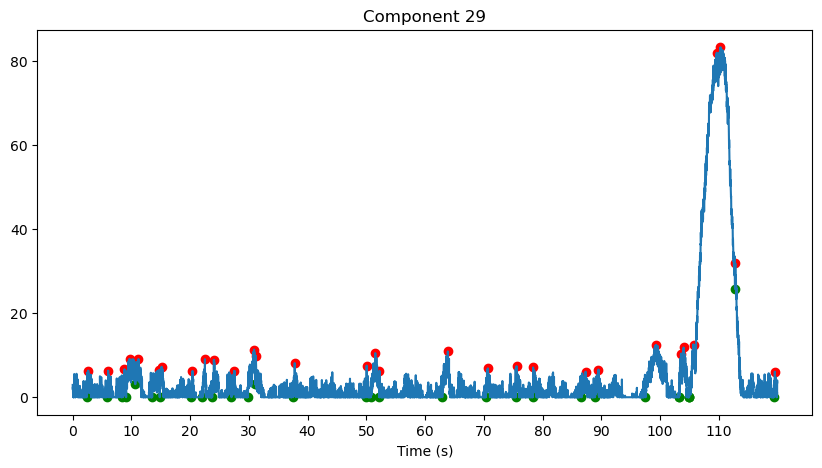

In [10]:
plt.figure(figsize=(10, 5))
plt.plot(W2[:, 28], label="Component 29")
plt.title("Component 29")
#change x axis from frames to seconds
total_frames = W2.shape[0]
fps = 80
start_seconds = 0
step_seconds = 10  # Show every 5 seconds

# Compute positions and labels
second_ticks = range(0, total_frames // fps + 1, step_seconds)       # e.g., [0, 5, 10, ...]
frame_positions = [s * fps for s in second_ticks]                    # e.g., [0, 400, 800, ...]
second_labels = [s + start_seconds for s in second_ticks]           # e.g., [75, 80, 85, ...]


from scipy.signal import find_peaks
peaks2, stats2 = find_peaks(W2[:, 28], prominence=6, width=0.1)
plt.scatter(peaks2, W2[peaks2, 28], color='red', label='Peaks')
plt.scatter(stats2['left_bases'], W2[stats2['left_bases'], 28], color='green', label='Left Bases')
# Apply to plot
plt.xticks(frame_positions, second_labels)
plt.xlabel("Time (s)")
plt.show()

In [11]:
#calculate the rising slope of the peaks using left_base
rising_slopes = []
for i, peak in enumerate(peaks2):
    # Find the left base of the peak
    left_base = stats2['left_bases'][i]
    # Calculate the slope
    slope = (W2[peak, 28] - W2[left_base, 28]) / (peak - left_base)
    rising_slopes.append(slope)
print(np.mean(rising_slopes))

0.6995697772261402


Text(0, 0.5, 'Peak Widths')

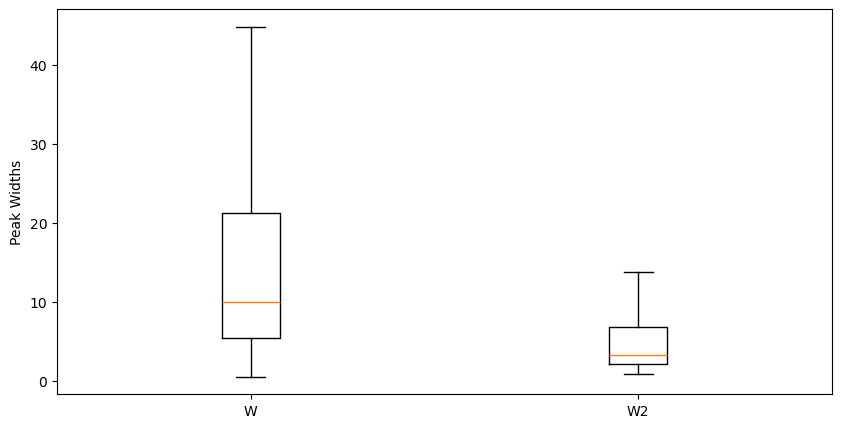

In [7]:
widths2 = []
widths = []
for i in range(10, 40, 1):
    _, stats2 = find_peaks(W2[:, i], prominence=6, width=0.1)
    widths2.extend(stats2["widths"])
    _, stats = find_peaks(W[:, i], prominence=6, width=0.1)
    widths.extend(stats["widths"])


#compare widths of peaks in boxplots between W and W2
plt.figure(figsize=(10, 5))
plt.boxplot([widths, widths2], tick_labels=["W", "W2"], showfliers=False)
plt.ylabel("Peak Widths")

Text(0, 0.5, 'Number of Peaks')

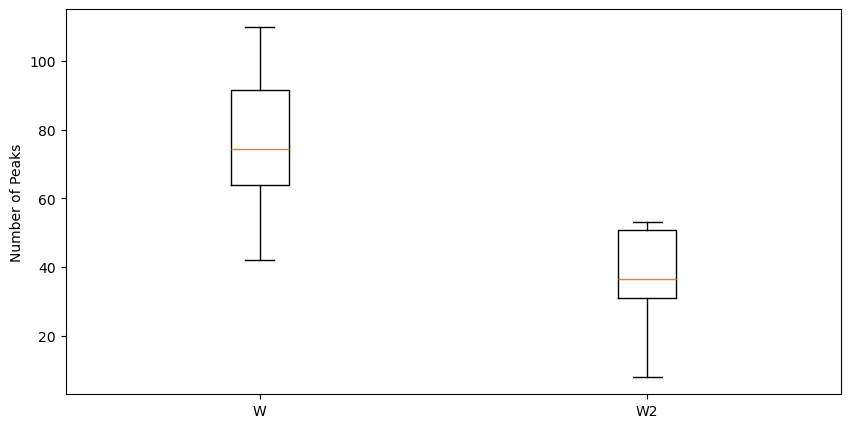

In [5]:
widths2 = []
widths = []
for i in range(10, 40, 1):
    _, stats2 = find_peaks(W2[:, i], prominence=6, width=0.1)
    widths2.append(len(stats2["widths"]))
    _, stats = find_peaks(W[:, i], prominence=6, width=0.1)
    widths.append(len(stats["widths"]))


#compare widths of peaks in boxplots between W and W2
plt.figure(figsize=(10, 5))
plt.boxplot([widths, widths2], tick_labels=["W", "W2"], showfliers=False)
plt.ylabel("Number of Peaks")

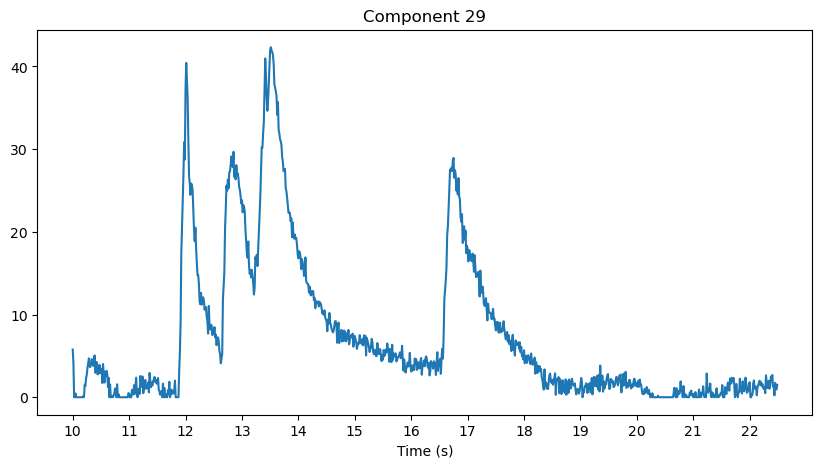

In [85]:
plt.figure(figsize=(10, 5))
plt.plot(W[800:1800, 28], label="Component 29")
plt.title("Component 29")
#change x axis from frames to seconds
total_frames = 1000
fps = 80
start_seconds = 10
step_seconds = 1  # Show every 5 seconds

# Compute positions and labels
second_ticks = range(0, total_frames // fps + 1, step_seconds)       # e.g., [0, 5, 10, ...]
frame_positions = [s * fps for s in second_ticks]                    # e.g., [0, 400, 800, ...]
second_labels = [s + start_seconds for s in second_ticks]           # e.g., [75, 80, 85, ...]

# Apply to plot
plt.xticks(frame_positions, second_labels)
plt.xlabel("Time (s)")
plt.show()

In [48]:
#save the H and W matrices with pickledump
nmf_path = utils.save_nmf(root_folder=".", components=components,W=W,name="nmf_components.pkl")

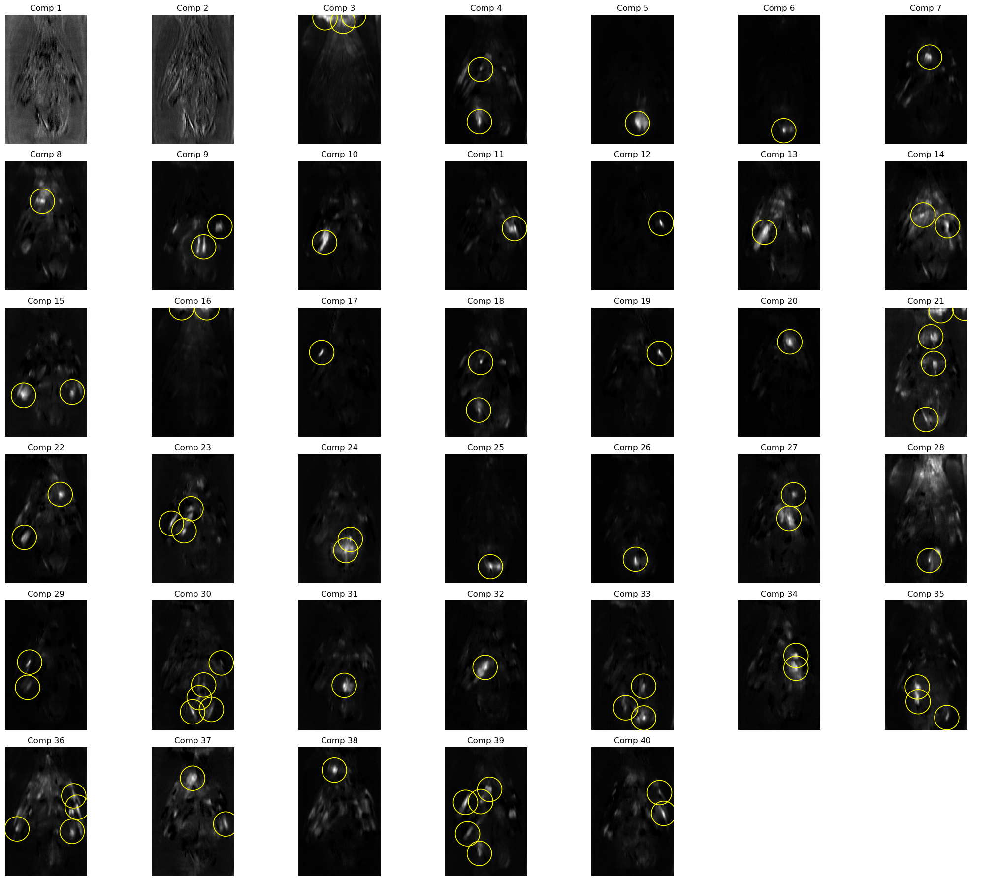

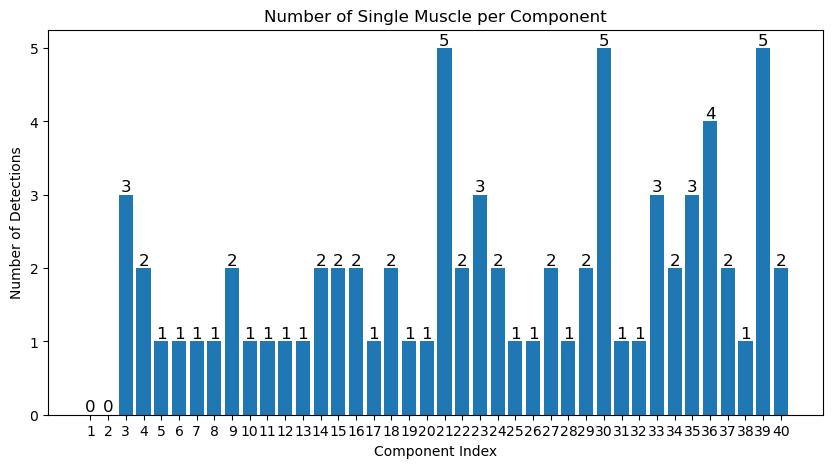

In [17]:

detections_pk1 = utils.detect_blobs_via_peak_local_max(
    components,
    min_distance=20,
    threshold_abs=0.51
)

# plot them
utils.plot_peaks_on_components(components, detections_pk1, radius_factor=3.0)
# 3. Visualise number of detections per component
plt.figure(figsize=(10, 5))
plt.bar_label(plt.bar(range(len(detections_pk1)), [len(d) for d in detections_pk1]), fontsize=12)
plt.xticks(range(len(detections_pk1)), [f"{i+1}" for i in range(len(detections_pk1))])
plt.title("Number of Single Muscle per Component")
plt.xlabel("Component Index")
plt.ylabel("Number of Detections")
None

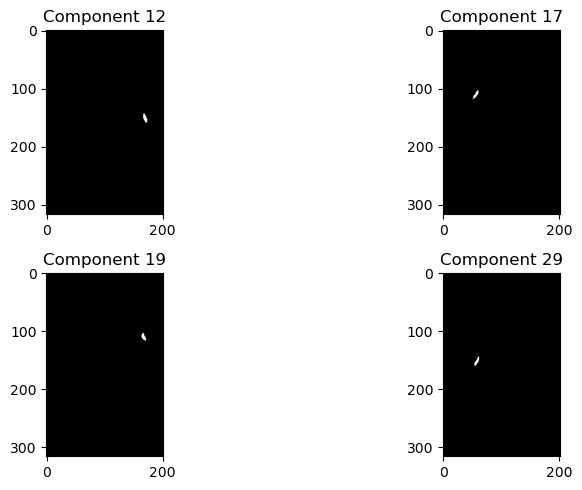

In [3]:
#apply otsu's thresholding to every component before applying 2-D peak finding
otsu_masks = [cv2.threshold(component.astype(np.uint8), 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)[1] for component in components]
otsu_masks = np.array(otsu_masks)
#show components 12,17,19 and 29 after otsu thresholding in a 2x2 grid
fig, axs = plt.subplots(2, 2, figsize=(10, 5))
for i,index in enumerate([11,16,18,28]):
    axs[i//2, i%2].imshow(otsu_masks[index], cmap='gray')
    axs[i//2, i%2].set_title(f"Component {index+1}")
plt.tight_layout()
plt.show()

In [24]:
importlib.reload(utils)

<module 'my_utils.utils' from 'c:\\Master\\Master_thesis\\muscle_imaging\\Pipeline_analysis\\my_utils\\utils.py'>

In [87]:
out_path = utils.save_overlay_video("Z:/data/LD/experiments/imaging/output/Automated_experiment/pupa_10/recording40_21032025_0928/output_video_40fps.mp4",
                                    "./overlay_video40_comp29.mp4",
                                  crop_origin=(x,y),
                                  resize_factor=2.0,
                                  detections=detections_pk1,
                                  circle_thickness=1,
                                  radius_scale=2.0,
                                  component_idxs=28)   


In [31]:
save_path = utils.save_overlay_video_with_masks(video_path="Z:/data/LD/experiments/imaging/output/Automated_experiment/pupa_10/recording16_20032025_0925/output_video_40fps.mp4",
                                                output_path="./overlay_video16_heartmuscles.mp4",
                                  crop_origin=(x,y),
                                  #give 4 masks out of otsu_masks by indices
                                  masks=otsu_masks[[11,16,18,28]],
                                  resize_factor=2.0,
                                  contour_thickness=2)

#### Same analysis for another earlier video

In [2]:
root_folder2 = "Z:/data/LD/experiments/imaging/output/Automated_experiment/pupa_10/recording29_20032025_2225"

In [36]:
#Do the same analysis for another video
x=127
y=724
w=403
h=633
# Load the frames from the main MKV file and apply mask to them
# mkv_file_path = [os.path.join(root_folder2, file) for file in os.listdir(root_folder2) if file.endswith('.mkv')][0]
temp_frame_dir2 = "extracted_frames2"
#only extract frames if the directory does not exist
if not os.path.exists(temp_frame_dir2):
    utils.extract_frames_from_mkv(mkv_file_path, temp_frame_dir2, limit_frames=None)
print("Extracted frames from MKV file")
raw_frames = utils.load_frames_fast(temp_frame_dir2, delete_frames=False)
vis_raw_frame = raw_frames[0]
print("Loaded frames from MKV file")
masked_frames = raw_frames[:, y:y+h, x:x+w]
print("Applied cropping to frames")

Extracted frames from MKV file
Loaded 9598 frames of shape (1920, 864)
Loaded frames from MKV file
Applied cropping to frames


Applied temporal filter to frames
Applied reduction to frames
Final frames shape: (9598, 316, 201)


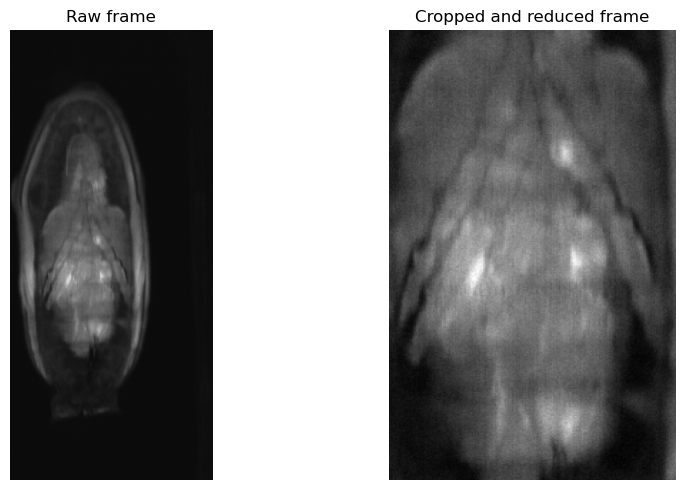

Applied baseline removal to frames


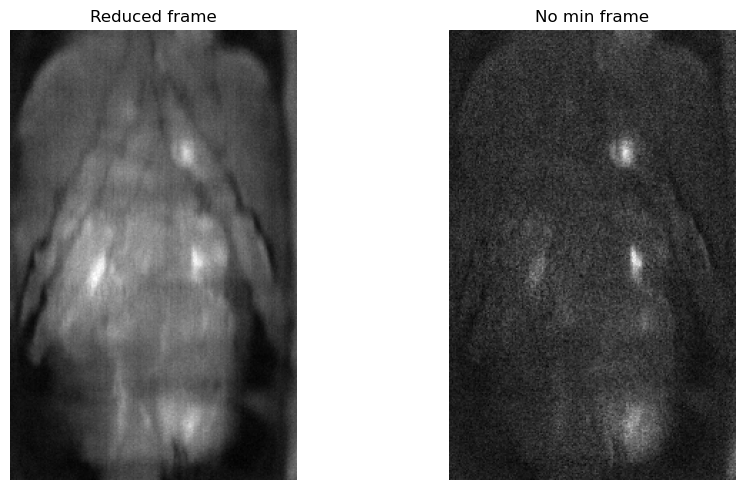

In [5]:
temporal_frames = utils.temporal_filter(masked_frames, HIGH_CUTOFF=30.0)
print("Applied temporal filter to frames")
del masked_frames
reduced_frames = utils.reduce_frame(temporal_frames, factor = 2, method = "opencv")
print("Applied reduction to frames")
del temporal_frames
print("Final frames shape:", reduced_frames.shape)
utils.visualize_two_frames(vis_raw_frame,reduced_frames[0], title1="Raw frame", title2="Cropped and reduced frame")
no_min_frames2 = utils.remove_baseline(reduced_frames, clip =False)
print("Applied baseline removal to frames")
utils.visualize_two_frames(reduced_frames[0], no_min_frames2[0], title1="Reduced frame", title2="No min frame")
del reduced_frames

violation: 1.0
violation: 0.48549047080156754
violation: 0.3074957762626853
violation: 0.23788739103885245
violation: 0.20325571591679875
violation: 0.18387141476853167
violation: 0.1707359551956469
violation: 0.16055438072919478
violation: 0.15216975650779954
violation: 0.1450614776068238
violation: 0.1389115620321176
violation: 0.1334104025689976
violation: 0.12842930528941873
violation: 0.12388918576868063
violation: 0.11972256608188106
violation: 0.11586430493434983
violation: 0.11227966565961613
violation: 0.10899551950534848
violation: 0.10592773665638253
violation: 0.10310497854058576
violation: 0.10052055423583339
violation: 0.09813069643251703
violation: 0.09592151763465963
violation: 0.09388053850598484
violation: 0.09197813638581806
violation: 0.09016442174608044
violation: 0.08848306113692861
violation: 0.08690480279137557
violation: 0.08539791613628869
violation: 0.08396940302633424
violation: 0.08263051946677553
violation: 0.0813740979370992
violation: 0.08018752743376976

c:\ProgramData\miniconda3\envs\mthesis_env\Lib\site-packages\sklearn\decomposition\_nmf.py:1759: ConvergenceWarning: Maximum number of iterations 1000 reached. Increase it to improve convergence.
  warnings.warn(


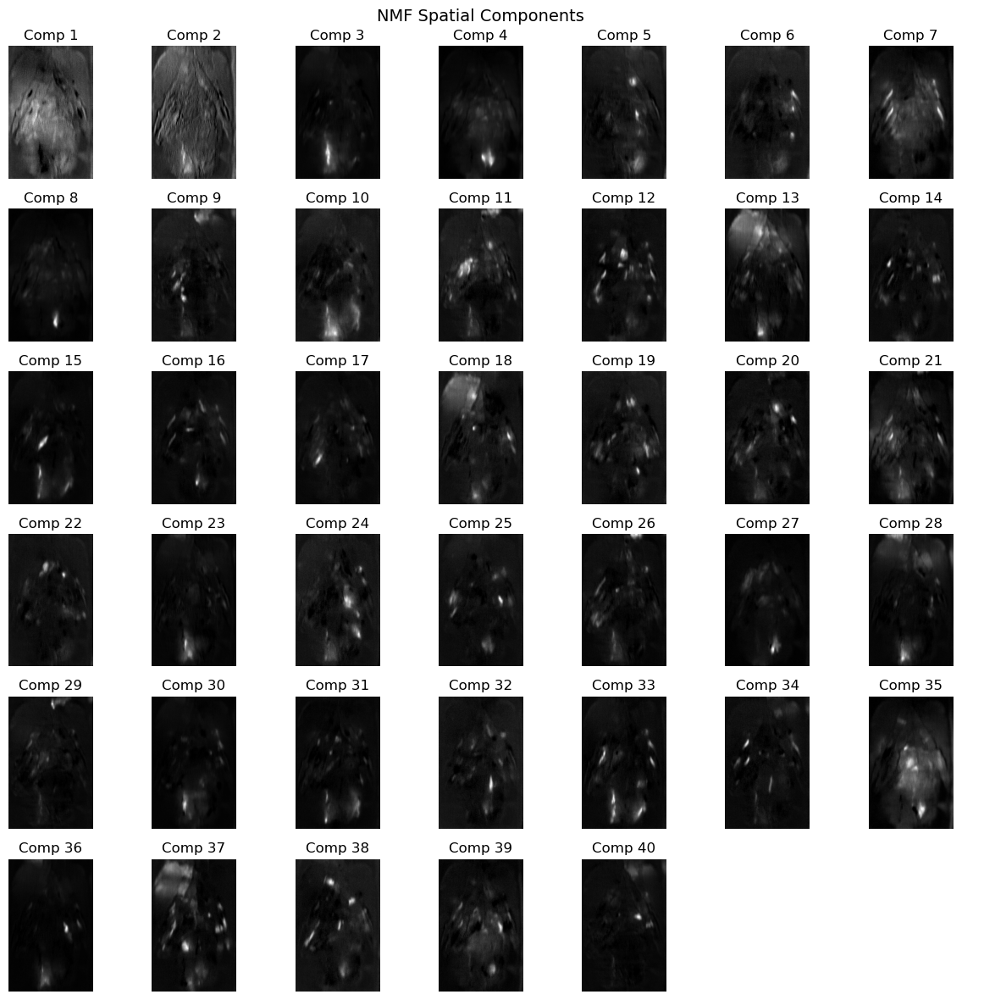

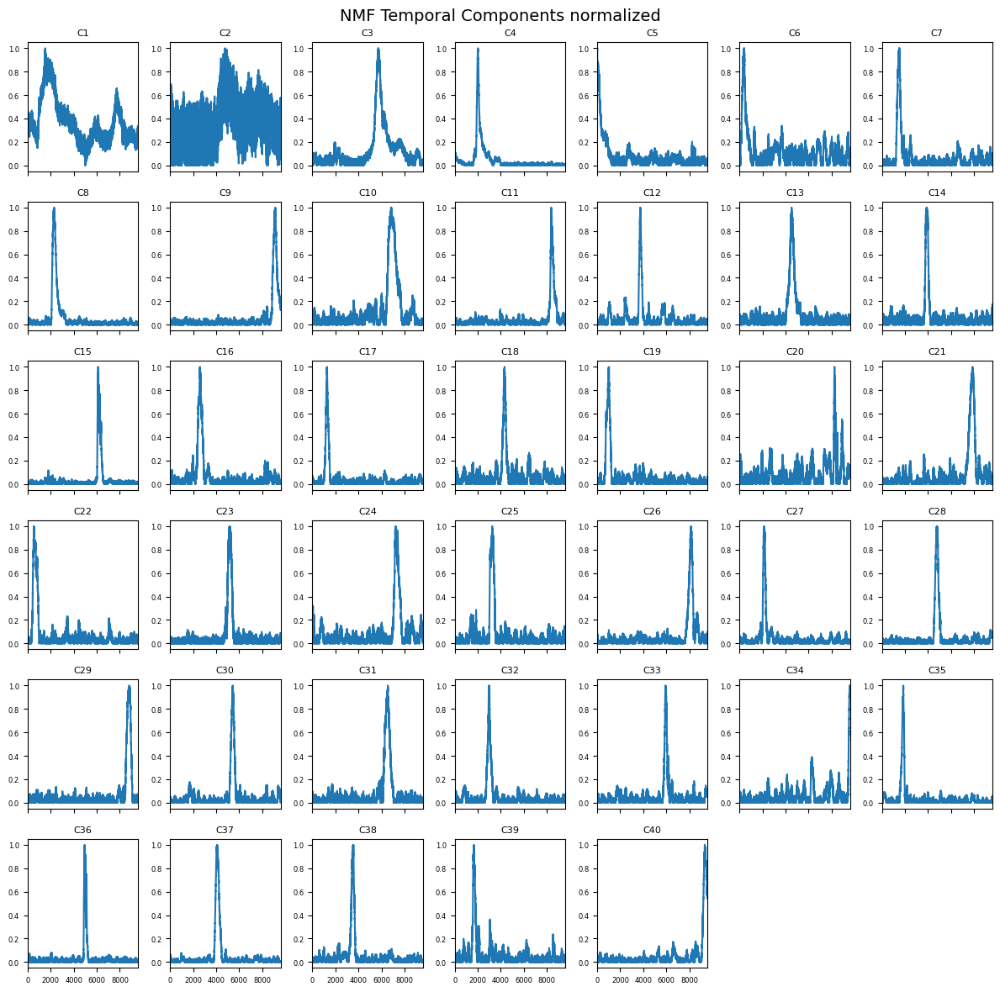

In [5]:
components2, W2 = utils.apply_nmf(frames=no_min_frames2,n_components=40, verbose=2, alpha_H= 1.0,tol=5e-3, max_iter=1000, scaling = False,save=False)


In [38]:
with open("nmf2_components.pkl", "rb") as f:
    components2,W2 = pickle.load(f)

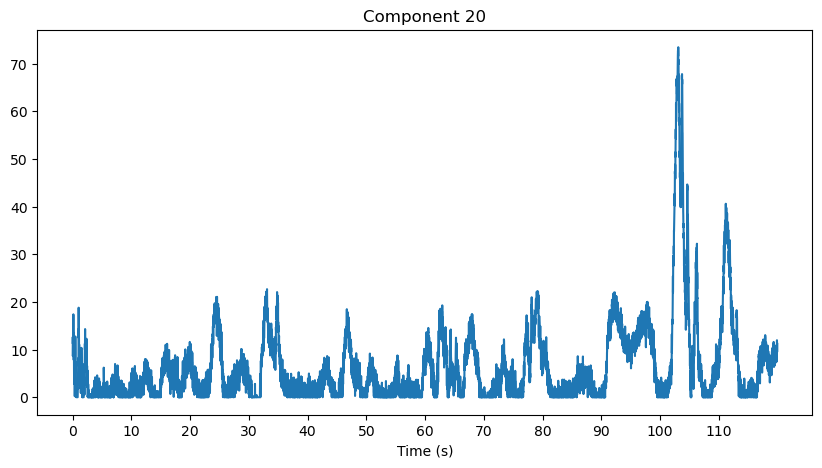

In [93]:
plt.figure(figsize=(10, 5))
plt.plot(W2[:, 19], label="Component 20")
plt.title("Component 20")
#change x axis from frames to seconds
total_frames = W2.shape[0]
fps = 80
start_seconds = 0
step_seconds = 10  # Show every 5 seconds

# Compute positions and labels
second_ticks = range(0, total_frames // fps + 1, step_seconds)       # e.g., [0, 5, 10, ...]
frame_positions = [s * fps for s in second_ticks]                    # e.g., [0, 400, 800, ...]
second_labels = [s + start_seconds for s in second_ticks]           # e.g., [75, 80, 85, ...]

# Apply to plot
plt.xticks(frame_positions, second_labels)
plt.xlabel("Time (s)")
plt.show()

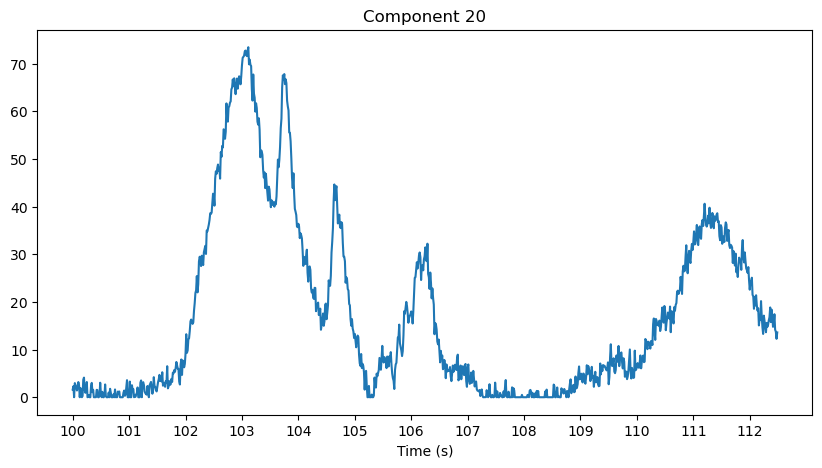

In [98]:
plt.figure(figsize=(10, 5))
plt.plot(W2[8000:9000, 19], label="Component 20")
plt.title("Component 20")
#change x axis from frames to seconds
total_frames = 1000
fps = 80
start_seconds = 100  # your desired starting point in seconds

# Compute tick positions and labels
second_ticks = range(0, total_frames // fps + 1)              # [0, 1, 2, ...]
frame_positions = [s * fps for s in second_ticks]             # [0, 80, 160, ...]
second_labels = [s + start_seconds for s in second_ticks]     # [75, 76, 77, ...]

# Apply to plot
plt.xticks(frame_positions, second_labels)
plt.xlabel("Time (s)")
plt.show()

In [34]:
nmf2_path = utils.save_nmf(root_folder=".", components=components2,W=W2,name="nmf2_components.pkl")

In [70]:
import importlib
importlib.reload(utils)

<module 'my_utils.utils' from 'c:\\Master\\Master_thesis\\muscle_imaging\\Pipeline_analysis\\my_utils\\utils.py'>

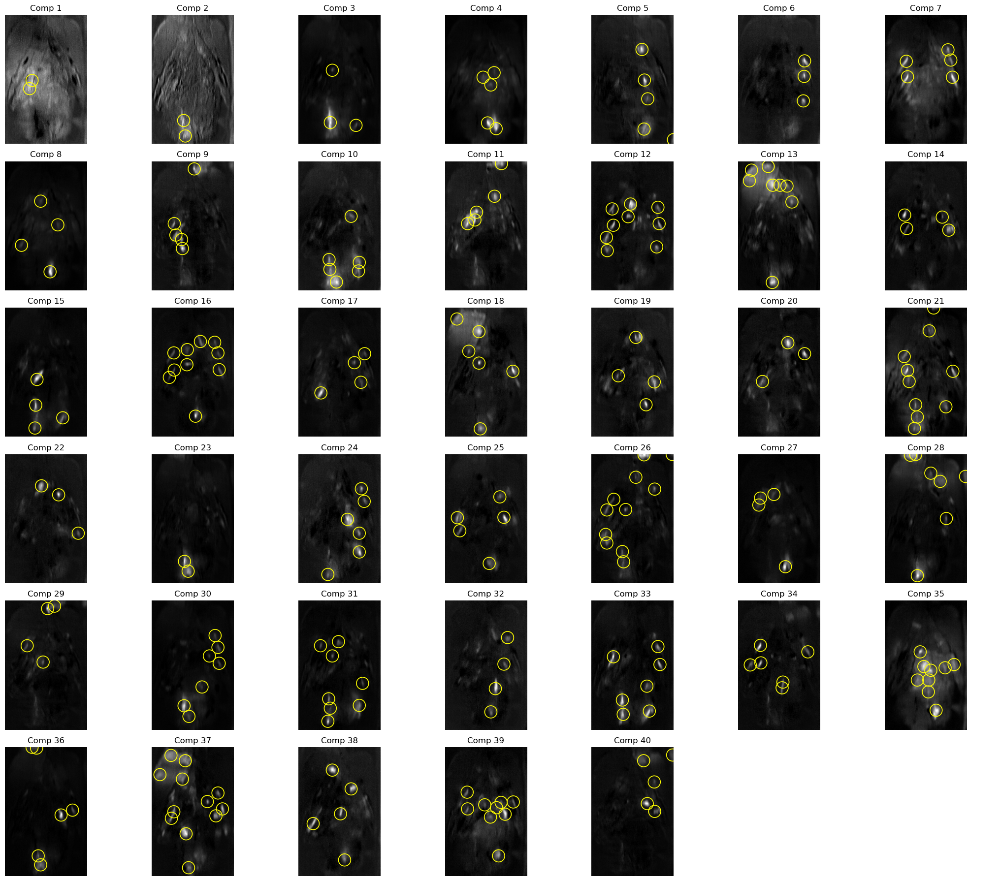

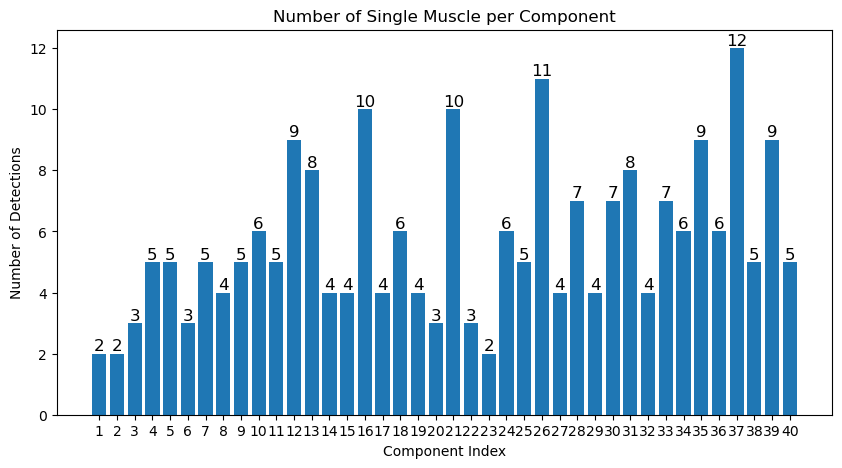

In [80]:
detections_pk2 = utils.detect_blobs_via_peak_local_max(
    components2,
    min_distance=10,
    threshold_abs=0.41,
)

# plot them
utils.plot_peaks_on_components(components2, detections_pk2, radius_factor=3.0)
# 3. Visualise number of detections per component
plt.figure(figsize=(10, 5))
plt.bar_label(plt.bar(range(len(detections_pk2)), [len(d) for d in detections_pk2]), fontsize=12)
plt.xticks(range(len(detections_pk2)), [f"{i+1}" for i in range(len(detections_pk2))])
plt.title("Number of Single Muscle per Component")
plt.xlabel("Component Index")
plt.ylabel("Number of Detections")
None

In [88]:
out_path = utils.save_overlay_video("Z:/data/LD/experiments/imaging/output/Automated_experiment/pupa_10/recording29_20032025_2225/output_video_40fps.mp4",
                                    "./overlay_video29_comp15.mp4",
                                  crop_origin=(x,y),
                                  resize_factor=2.0,
                                  detections=detections_pk2,
                                  circle_thickness=1,
                                  radius_scale=2.0,
                                  component_idxs=14)   


#### Same on video even earlier video, video 16

In [51]:
root_folder3= "Z:/data/LD/experiments/imaging/output/Automated_experiment/pupa_10/recording16_20032025_0925"
del no_min_frames

In [52]:
#Do the same analysis for another video
x=127
y=724
w=403
h=633
# Load the frames from the main MKV file and apply mask to them
mkv_file_path = [os.path.join(root_folder3, file) for file in os.listdir(root_folder3) if file.endswith('.mkv')][0]
temp_frame_dir3 = "extracted_frames3"
#only extract frames if the directory does not exist
if not os.path.exists(temp_frame_dir3):
    utils.extract_frames_from_mkv(mkv_file_path, temp_frame_dir3, limit_frames=None)
print("Extracted frames from MKV file")
raw_frames = utils.load_frames_fast(temp_frame_dir3, delete_frames=False)
vis_raw_frame = raw_frames[0]
print("Loaded frames from MKV file")
masked_frames = raw_frames[:, y:y+h, x:x+w]
print("Applied cropping to frames")

Extracted frames from MKV file
Loaded 9598 frames of shape (1920, 864)
Loaded frames from MKV file
Applied cropping to frames


Applied temporal filter to frames
Applied reduction to frames
Final frames shape: (9598, 316, 201)


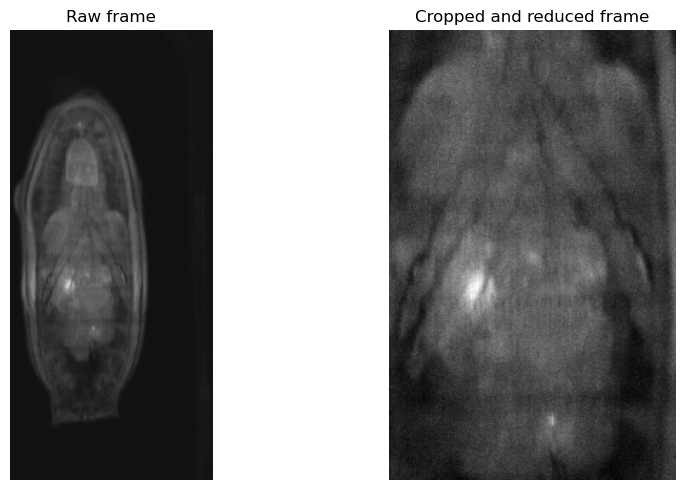

Applied baseline removal to frames


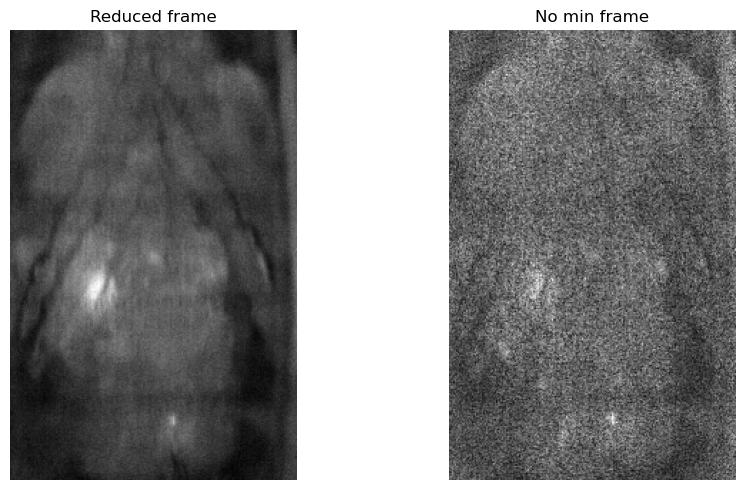

In [53]:
temporal_frames = utils.temporal_filter(masked_frames, HIGH_CUTOFF=30.0)
print("Applied temporal filter to frames")
del masked_frames
reduced_frames = utils.reduce_frame(temporal_frames, factor = 2, method = "opencv")
print("Applied reduction to frames")
del temporal_frames
print("Final frames shape:", reduced_frames.shape)
utils.visualize_two_frames(vis_raw_frame,reduced_frames[0], title1="Raw frame", title2="Cropped and reduced frame")
no_min_frames3 = utils.remove_baseline(reduced_frames, clip =False)
print("Applied baseline removal to frames")
utils.visualize_two_frames(reduced_frames[0], no_min_frames3[0], title1="Reduced frame", title2="No min frame")
del reduced_frames

In [4]:
components3, W3 = utils.apply_nmf(frames=no_min_frames3,n_components=40, verbose=2, alpha_H= 1.0,tol=5e-3, max_iter=1000, scaling = False,save=False)

NameError: name 'no_min_frames3' is not defined

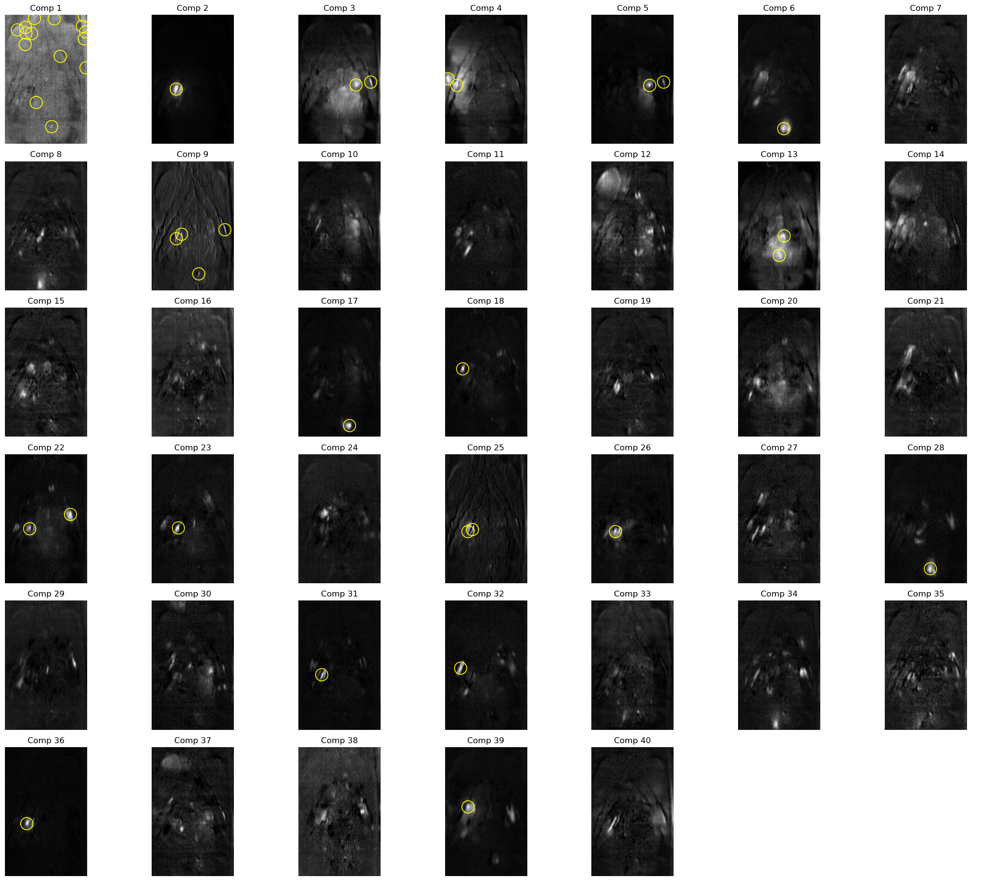

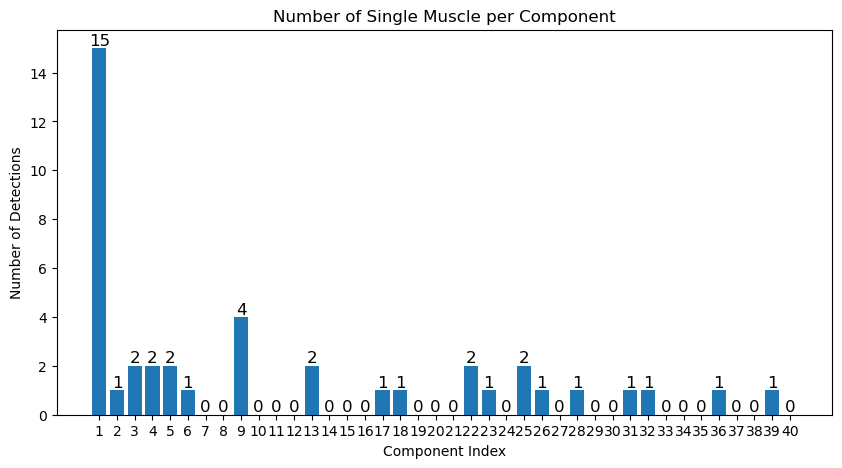

In [82]:
detections_pk3 = utils.detect_blobs_via_peak_local_max(
    components3,
    min_distance=10,
    threshold_abs=0.51
)

# plot them
utils.plot_peaks_on_components(components3, detections_pk3, radius_factor=3.0)
# 3. Visualise number of detections per component
plt.figure(figsize=(10, 5))
plt.bar_label(plt.bar(range(len(detections_pk3)), [len(d) for d in detections_pk3]), fontsize=12)
plt.xticks(range(len(detections_pk3)), [f"{i+1}" for i in range(len(detections_pk3))])
plt.title("Number of Single Muscle per Component")
plt.xlabel("Component Index")
plt.ylabel("Number of Detections")
None

In [56]:
nmf3_path = utils.save_nmf(root_folder=".", components=components3,W=W3,name="nmf3_components.pkl")

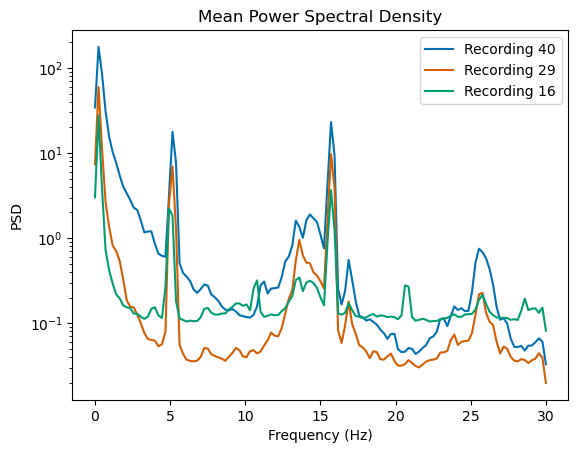

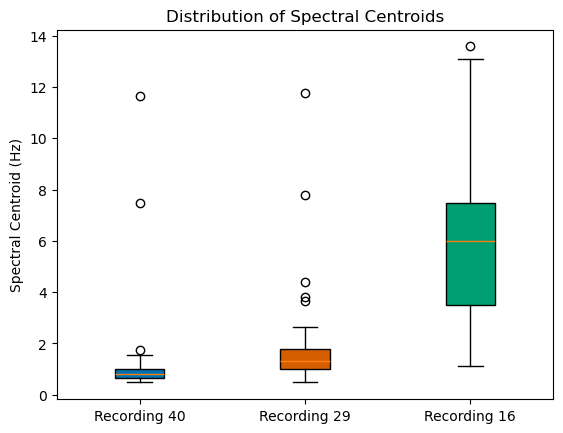

Pairwise t-test results for spectral centroids:
        Video A       Video B    mean_A    mean_B    t_stat       p_value
0  Recording 40  Recording 29  1.303551  1.897955 -1.307124  1.950108e-01
1  Recording 40  Recording 16  1.303551  5.923219 -7.561362  6.623037e-11
2  Recording 29  Recording 16  1.897955  5.923219 -6.526350  6.182210e-09


In [77]:
results = utils.compare_nmf_spectra(
    W_list=[W.T, W2.T, W3.T],
    labels=["Recording 40", "Recording 29", "Recording 16"],
)

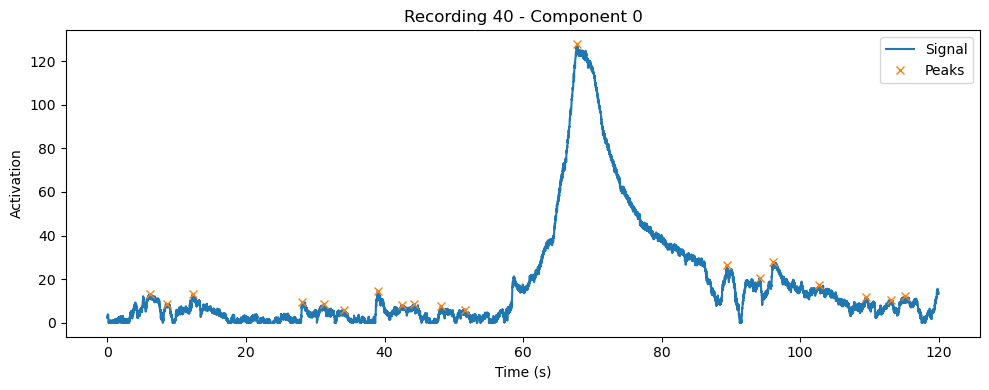

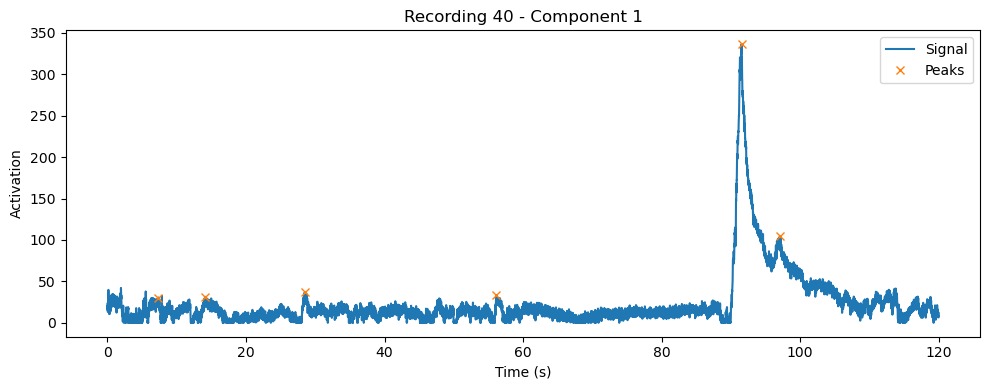

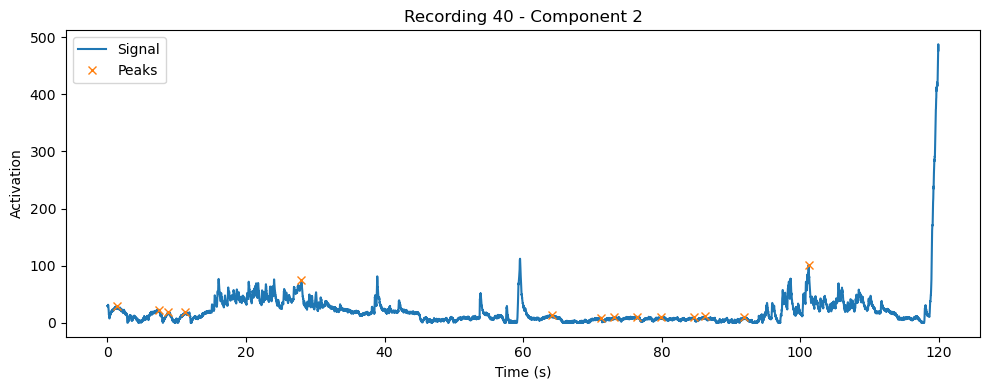

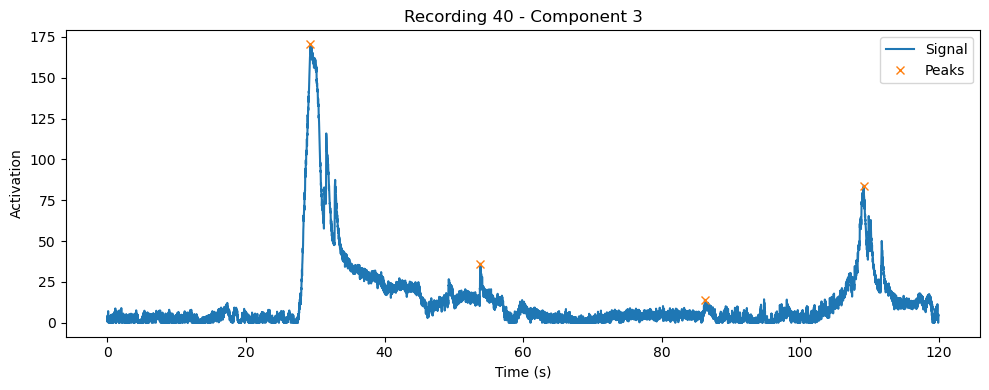

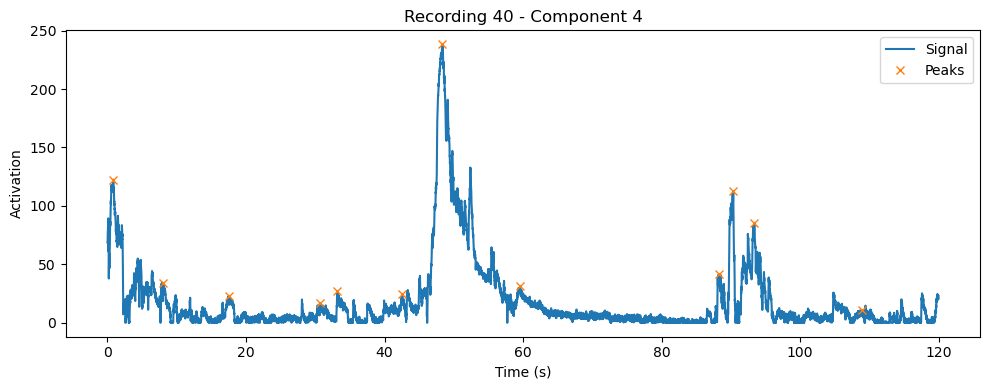

...

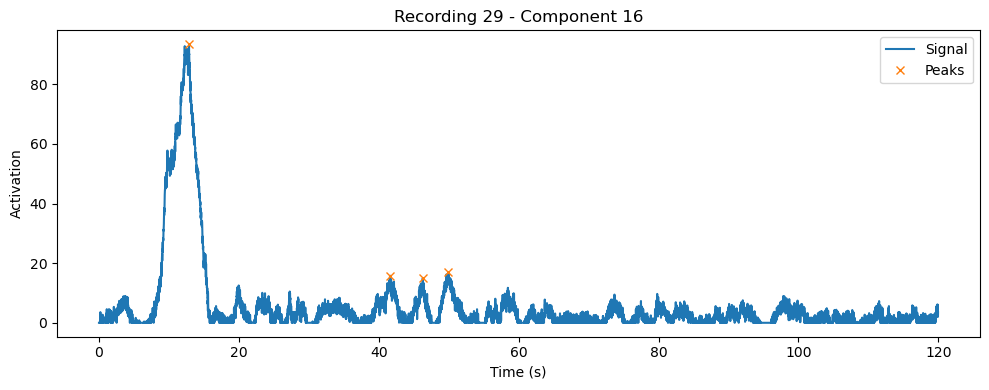

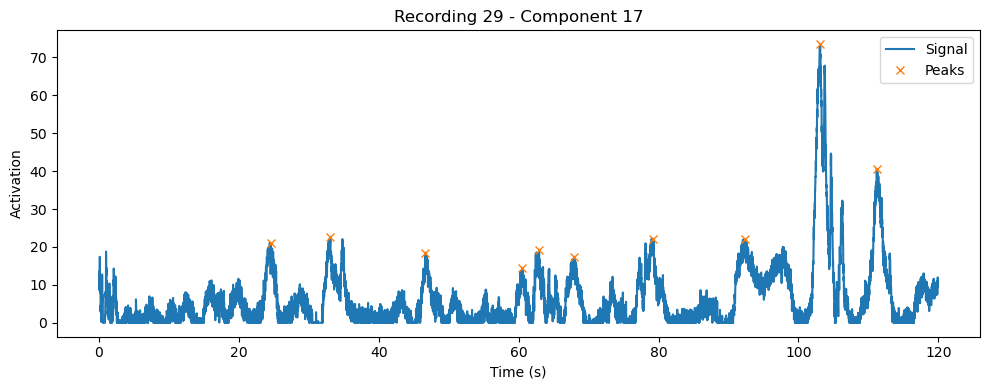

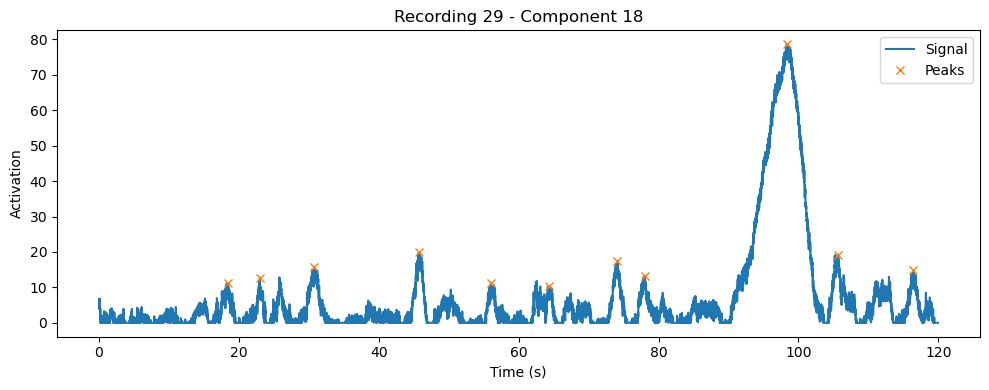

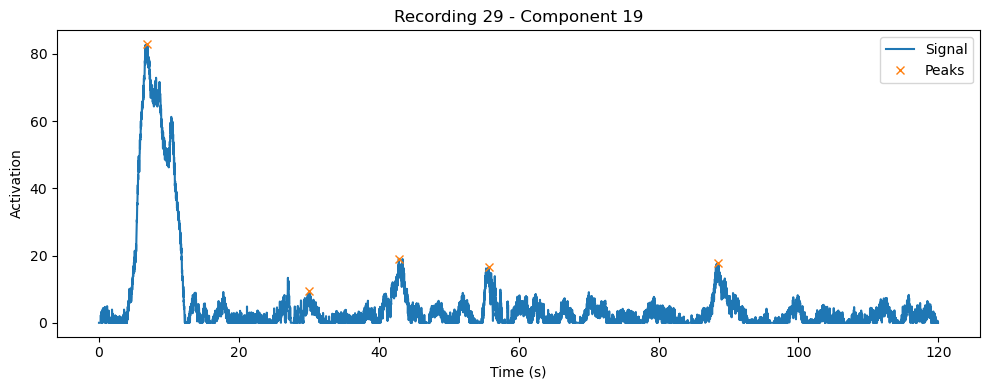

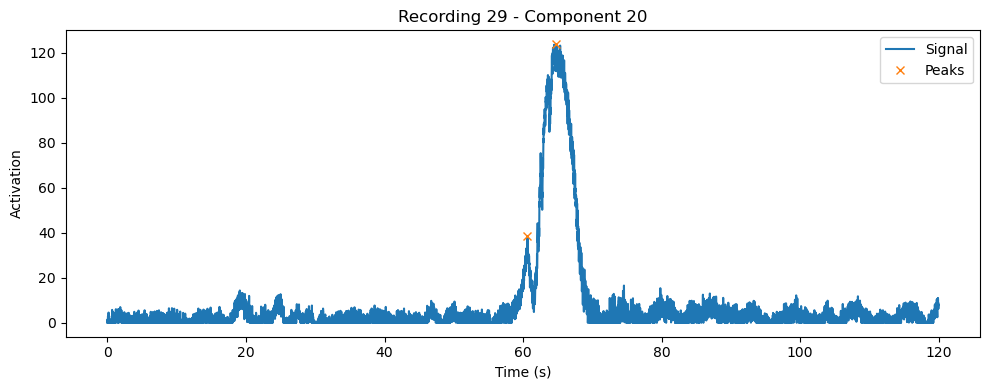

KeyboardInterrupt: 

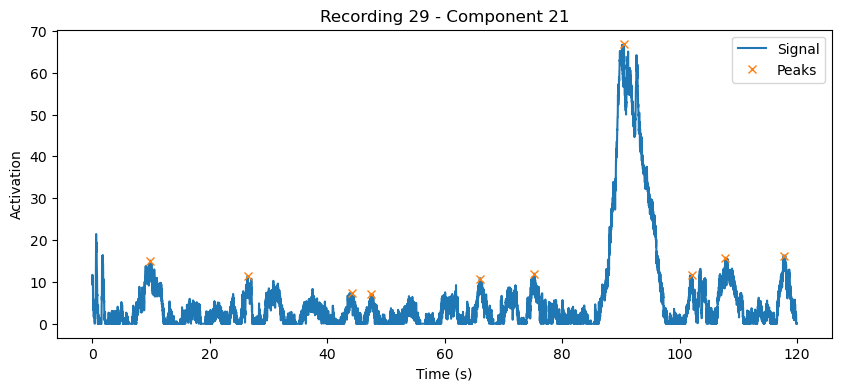

In [116]:
stats = utils.analyze_nmf_peaks(
    W_list=[W, W2, W3],
    labels=["Recording 40", "Recording 29", "Recording 16"],
    fs=80,
    prominence=None,
    distance=10,
    width=40,
    show=True,
    save=False,
    out_dir="C:/your/output/path"
)

In [34]:
root_folder35= "Z:/data/LD/experiments/imaging/output/Automated_experiment/pupa_10/recording35_21032025_0426"

Extracted frames from MKV file
Loaded 8961 frames of shape (1920, 864)
Loaded frames from MKV file
Applied cropping to frames
Applied temporal filter to frames
Applied reduction to frames
Final frames shape: (8961, 316, 201)


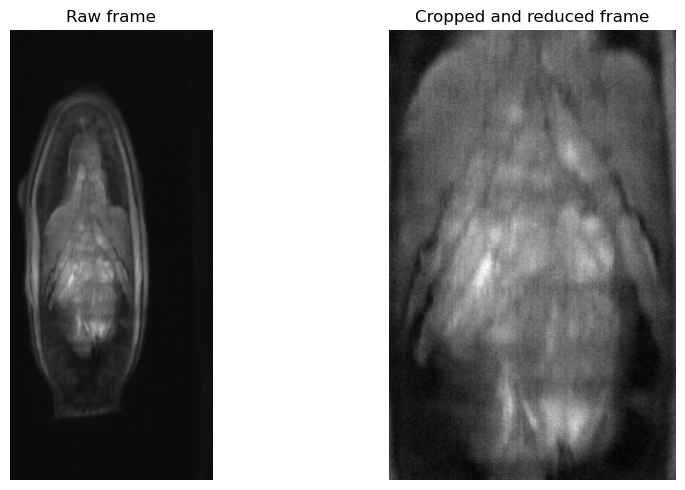

Applied baseline removal to frames


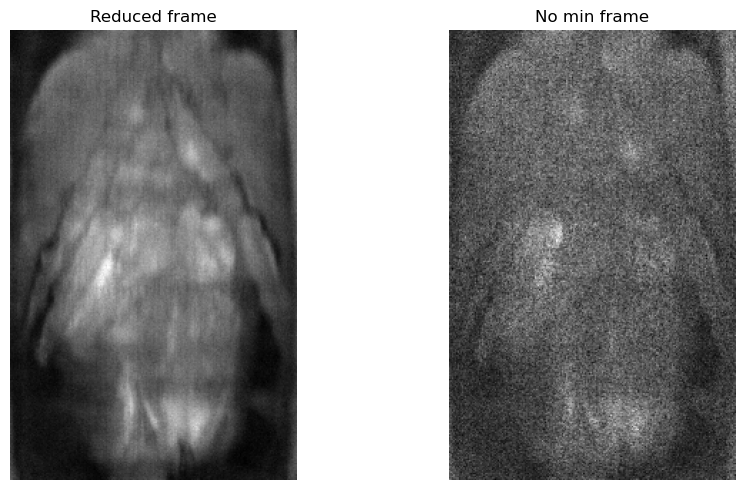

In [35]:
#Do the same analysis for another video
x=127
y=724
w=403
h=633
# Load the frames from the main MKV file and apply mask to them
mkv_file_path = [os.path.join(root_folder35, file) for file in os.listdir(root_folder35) if file.endswith('.mkv')][0]
temp_frame_dir35 = "extracted_frames35"
#only extract frames if the directory does not exist
if not os.path.exists(temp_frame_dir35):
    utils.extract_frames_from_mkv(mkv_file_path, temp_frame_dir35, limit_frames=None)
print("Extracted frames from MKV file")
raw_frames = utils.load_frames_fast(temp_frame_dir35, delete_frames=False)
vis_raw_frame = raw_frames[0]
print("Loaded frames from MKV file")
masked_frames = raw_frames[:, y:y+h, x:x+w]
print("Applied cropping to frames")
temporal_frames = utils.temporal_filter(masked_frames, HIGH_CUTOFF=30.0)
print("Applied temporal filter to frames")
del masked_frames
reduced_frames = utils.reduce_frame(temporal_frames, factor = 2, method = "opencv")
print("Applied reduction to frames")
del temporal_frames
print("Final frames shape:", reduced_frames.shape)
utils.visualize_two_frames(vis_raw_frame,reduced_frames[0], title1="Raw frame", title2="Cropped and reduced frame")
no_min_frames35 = utils.remove_baseline(reduced_frames, clip =False)
print("Applied baseline removal to frames")
utils.visualize_two_frames(reduced_frames[0], no_min_frames35[0], title1="Reduced frame", title2="No min frame")
del reduced_frames

Number of frames: 8961, number of pixels: 63516
violation: 1.0
violation: 0.6158279213153653
violation: 0.5691176278603353
violation: 0.5400617988214167
violation: 0.5049507870257004
violation: 0.4737555225887009
violation: 0.44610026023317645
violation: 0.42160165046569037
violation: 0.4011532634196877
violation: 0.38362253451667505
violation: 0.36818810164967264
violation: 0.35459556977693446
violation: 0.3422932107678874
violation: 0.33109481435768745
violation: 0.32089914350842735
violation: 0.31156148324491945
violation: 0.3029200800233184
violation: 0.2948787174795461
violation: 0.2873622959718335
violation: 0.2803335051221244
violation: 0.27375404322855074
violation: 0.2675846111649781
violation: 0.2617357640715212
violation: 0.25624562673687556
violation: 0.2509496455087053
violation: 0.24591056050851434
violation: 0.2413544118667988
violation: 0.23762565258083987
violation: 0.23395449378369815
violation: 0.23061686969588382
violation: 0.22858647381666744
violation: 0.225145228

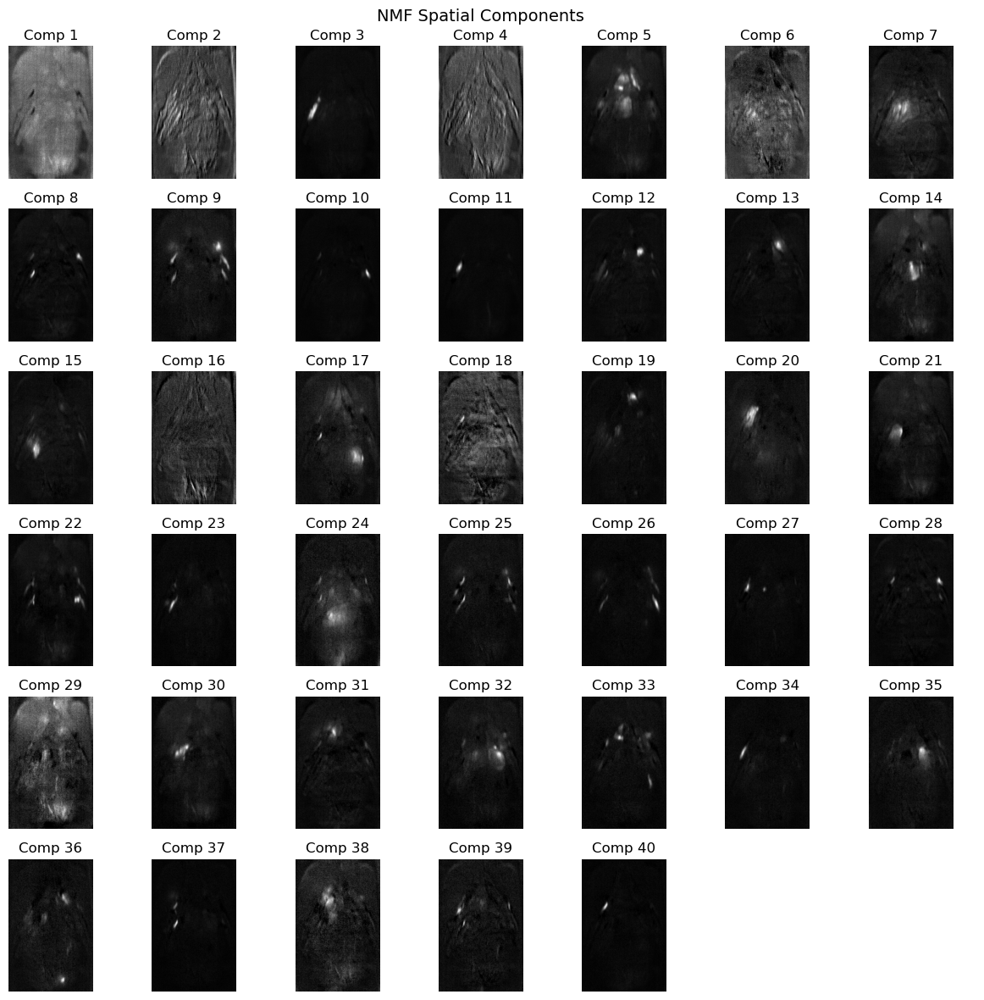

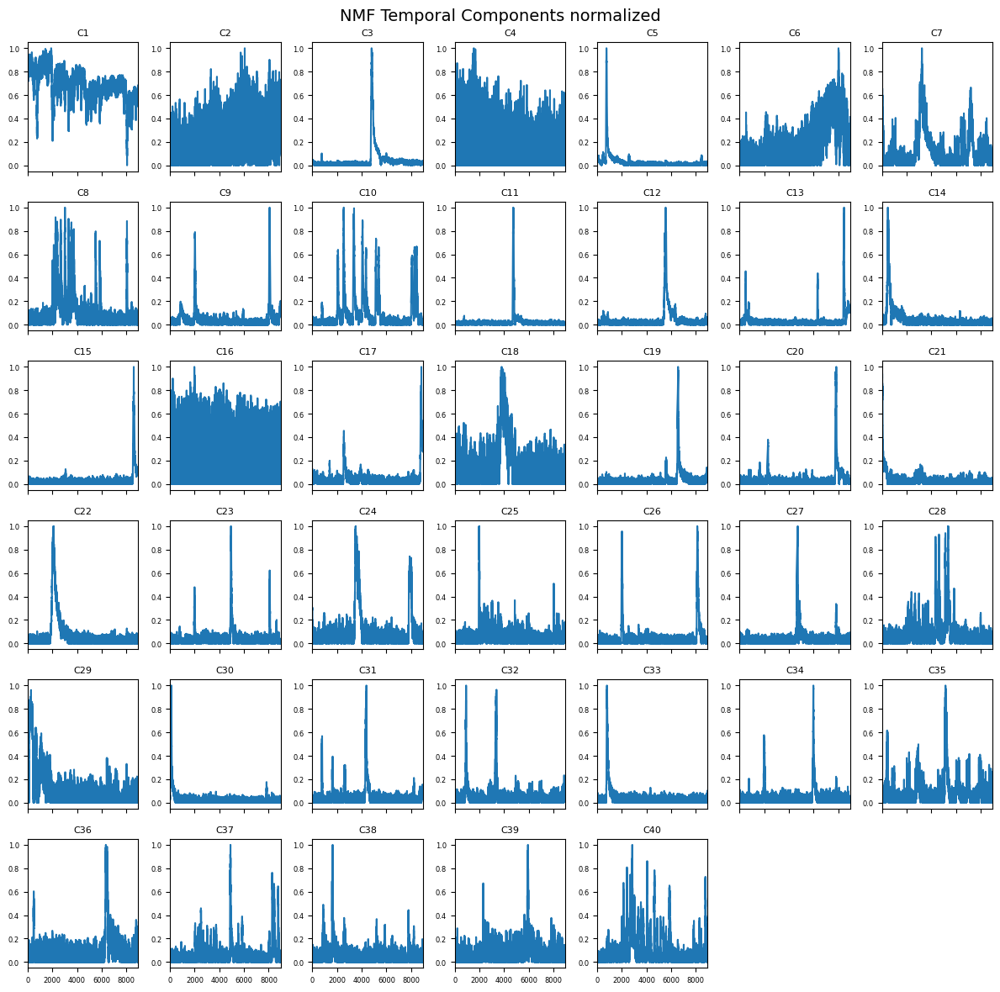

In [37]:
components35, W35 = utils.apply_nmf(frames=no_min_frames35,n_components=40, verbose=2, alpha_H= 1.0,tol=5e-2, max_iter=1500, scaling = False,save=False)

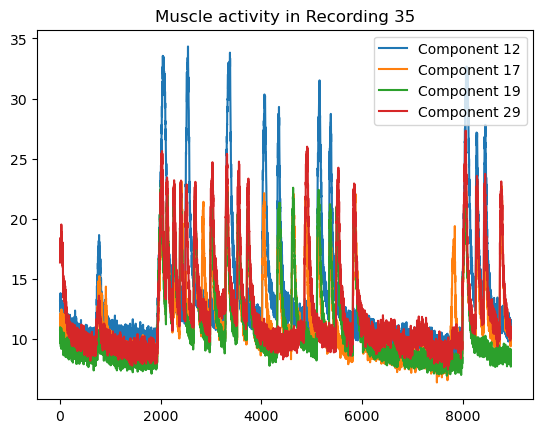

In [53]:
#Apply mask 12 to the frames and get the temporal trace by taking the mean of the pixels in the mask
masked_frames_12 = np.multiply(no_min_frames35, otsu_mask_12)
temporal_trace_mask12 = np.mean(masked_frames_12, axis=(1, 2))
masked_frames_17 = np.multiply(no_min_frames35, otsu_mask_17)
temporal_trace_mask17 = np.mean(masked_frames_17, axis=(1, 2))
masked_frames_19 = np.multiply(no_min_frames35, otsu_mask_19)
temporal_trace_mask19 = np.mean(masked_frames_19, axis=(1, 2))
masked_frames_29 = np.multiply(no_min_frames35, otsu_mask_29)
temporal_trace_mask29 = np.mean(masked_frames_29, axis=(1, 2))
#save the temporal traces to a file
with open("temporal_traces_35.pkl", "wb") as f:
    pickle.dump([temporal_trace_mask12, temporal_trace_mask17, temporal_trace_mask19, temporal_trace_mask29], f)
plt.plot(temporal_trace_mask12)
plt.plot(temporal_trace_mask17)
plt.plot(temporal_trace_mask19)
plt.plot(temporal_trace_mask29)
plt.legend(["Component 12", "Component 17", "Component 19", "Component 29"])
plt.title(f"Muscle activity in Recording 35")
plt.show()

In [38]:
with open("nmf35_components.pkl", "wb") as f:
    pickle.dump([components35,W35], f)

In [7]:
otsu_masks35 = [cv2.threshold(component.astype(np.uint8), 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)[1] for component in components35]
otsu_masks35 = np.array(otsu_masks35)



In [8]:
idxs35 = [7, 9, 36, 39]
idxs   = [11,16, 18, 28]

masks1 = [otsu_masks35[i] for i in idxs35]
masks2 = [otsu_masks   [i] for i in idxs  ]

IoUs:  [0.0, 0.0, 0.0, 0.0]
Centroid distances (pixels): [110.01818031580054, 121.8400590938793, 116.81181447096864, 40.01249804748511]


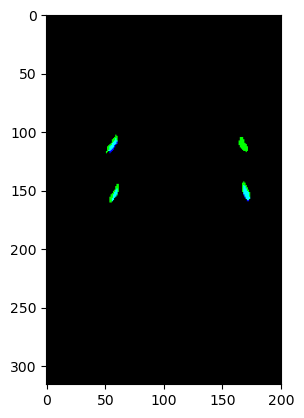

In [9]:
import cv2
import numpy as np

def compute_iou(m1, m2):
    # boolean arrays
    b1 = m1.astype(bool)
    b2 = m2.astype(bool)
    inter = np.logical_and(b1, b2).sum()
    union = np.logical_or (b1, b2).sum()
    return inter / union if union>0 else np.nan

# 1) Quantify overlap
ious = [compute_iou(m1, m2) for m1, m2 in zip(masks1, masks2)]
print("IoUs: ", ious)

# Optionally, also compute centroid distance:
def centroid(mask):
    M = cv2.moments(mask.astype(np.uint8))
    if M['m00']==0: return (np.nan, np.nan)
    return (int(M['m10']/M['m00']), int(M['m01']/M['m00']))

dists = []
for m1, m2 in zip(masks1, masks2):
    c1 = centroid(m1)
    c2 = centroid(m2)
    d  = np.hypot(c1[0]-c2[0], c1[1]-c2[1])
    dists.append(d)
print("Centroid distances (pixels):", dists)

# 2) Visualize overlay on a blank or real frame
# here, we’ll make a color canvas:
H, W = masks1[0].shape
canvas = np.zeros((H, W, 3), dtype=np.uint8)

for m1, m2 in zip(masks1, masks2):
    # draw mask1 in RED, mask2 in GREEN; overlap appears yellow
    canvas[m1.astype(bool), 2] = 255
    canvas[m2.astype(bool), 1] = 255
plt.imshow(canvas)

mask35[9] ↔ mask2[11]:  IoU = 0.589
mask35[27] ↔ mask2[18]:  IoU = 0.258
mask35[36] ↔ mask2[28]:  IoU = 0.400
mask35[39] ↔ mask2[16]:  IoU = 0.397
mask35[9] ↔ mask2[11]:  centroid dist = 2.1 px
mask35[27] ↔ mask2[18]:  centroid dist = 1.4 px
mask35[36] ↔ mask2[28]:  centroid dist = 1.0 px
mask35[39] ↔ mask2[16]:  centroid dist = 1.7 px


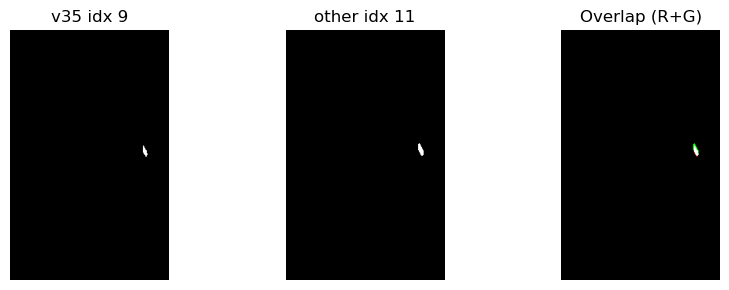

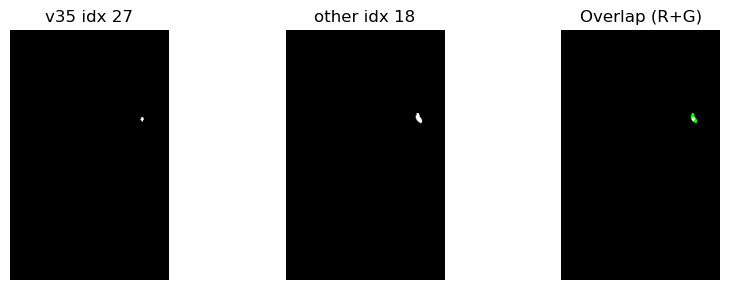

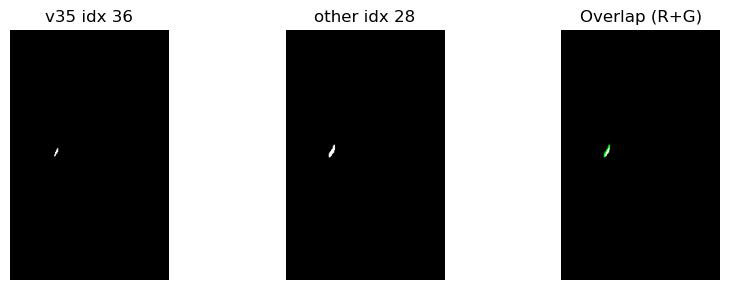

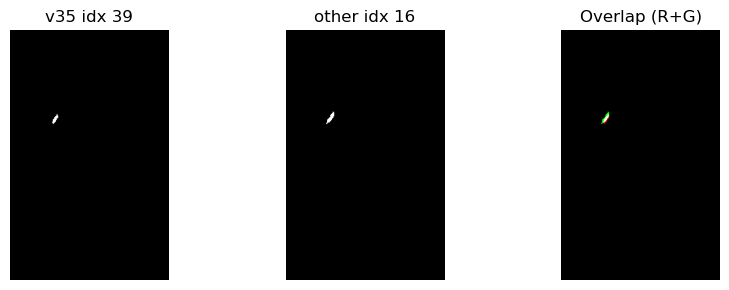

In [10]:
from scipy.optimize import linear_sum_assignment
import cv2
import numpy as np
from scipy.optimize import linear_sum_assignment

def compute_iou(m1, m2):
    b1 = m1.astype(bool)
    b2 = m2.astype(bool)
    inter = np.logical_and(b1, b2).sum()
    union = np.logical_or (b1, b2).sum()
    return inter / union if union>0 else 0.0

# pick out your 4 “interesting” masks:
idxs35 = [ 9,27, 36, 39]
idxs   = [11,16,18,28]

masks1 = [otsu_masks35[i] for i in idxs35]
masks2 = [otsu_masks   [i] for i in idxs  ]

# 1) build the 4×4 cost matrix = 1 - IoU
n = len(masks1)
cost = np.zeros((n,n), dtype=float)
for i, m1 in enumerate(masks1):
    for j, m2 in enumerate(masks2):
        cost[i,j] = 1.0 - compute_iou(m1, m2)

# 2) solve assignment
row_ind, col_ind = linear_sum_assignment(cost)
# row_ind == [0,1,2,3], col_ind gives which mask2 goes with mask1

# 3) report your matched IoUs
matched_ious = [1.0 - cost[i,j] for i,j in zip(row_ind, col_ind)]
for i, j, iou in zip(row_ind, col_ind, matched_ious):
    print(f"mask35[{idxs35[i]}] ↔ mask2[{idxs[j]}]:  IoU = {iou:.3f}")

def centroid(mask):
    M = cv2.moments(mask.astype(np.uint8))
    if M['m00']==0: return (np.nan,np.nan)
    return (M['m10']/M['m00'], M['m01']/M['m00'])

# build cost matrix of Euclidean distances
cost = np.zeros((n,n))
c1s = [centroid(m) for m in masks1]
c2s = [centroid(m) for m in masks2]
for i,(x1,y1) in enumerate(c1s):
    for j,(x2,y2) in enumerate(c2s):
        cost[i,j] = np.hypot(x1-x2, y1-y2)

row_ind, col_ind = linear_sum_assignment(cost)
for i,j in zip(row_ind, col_ind):
    print(f"mask35[{idxs35[i]}] ↔ mask2[{idxs[j]}]:  centroid dist = {cost[i,j]:.1f} px")
import matplotlib.pyplot as plt

for i,j in zip(row_ind, col_ind):
    fig, axs = plt.subplots(1,3, figsize=(9,3))
    axs[0].imshow(masks1[i], cmap='gray'); axs[0].set_title(f"v35 idx {idxs35[i]}")
    axs[1].imshow(masks2[j], cmap='gray'); axs[1].set_title(f"other idx {idxs[j]}")
    # overlap mask 1 in red, mask 2 in green
    overlap = np.zeros((*masks1[i].shape,3), dtype=np.uint8)
    overlap[masks1[i].astype(bool), 0] =255
    overlap[masks2[j].astype(bool), 1] = 255
    overlap[masks1[i].astype(bool) & masks2[j].astype(bool), 2] = 255  # overlap in blue
      # green
    axs[2].imshow(overlap); axs[2].set_title("Overlap (R+G)")
    for ax in axs: ax.axis('off')
    plt.tight_layout()
    plt.show()
